# Load std1 GRS1915 light curves and bin to 1s cadance

In [2]:
%load_ext autoreload
%autoreload 2
from IPython.display import clear_output
# from segment_cluster import segmentation
# import importlib
# import os
# import fnmatch
import numpy as np
# # from sklearn.model_selection import train_test_split
# from collections import Counter
# import csv
# from sklearn import tree
# import sys
# sys.stdout.flush()
# import math
import pickle
# from scipy.stats import zscore
# import datetime
# import pytz
# import matplotlib.pyplot as plt
# import lc_functions as lcf

# from matplotlib.table import Table


# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM
# from tensorflow.keras.layers import Dense
# from tensorflow.keras.layers import RepeatVector
# from tensorflow.keras.layers import TimeDistributed
# from tensorflow.keras.callbacks import EarlyStopping
# from tensorflow.keras.callbacks import ModelCheckpoint
# from tensorflow.keras.utils import plot_model

In [2]:
lcs, ids = lcf.load_and_bin()

In [4]:
# with open('1776_light_curves_1s_bin.pkl', 'wb') as f:oyuoyu
#     pickle.dump(lcs, f)
# with open('1776_light_curves_1s_bin_ids.pkl', 'wb') as f:
#     pickle.dump(ids, f)

In [157]:
with open('../../../data_GRS1915/1776_light_curves_1s_bin.pkl', 'rb') as f:
    lcs = pickle.load(f)
with open('../../../data_GRS1915/1776_light_curves_1s_bin_ids.pkl', 'rb') as f:
    ids = pickle.load(f)

In [159]:
clean_belloni = open('../../../data_GRS1915/1915Belloniclass_updated.dat')
lines = clean_belloni.readlines()
states = lines[0].split()
belloni_clean = {}
for h,l in zip(states, lines[1:]):
    belloni_clean[h] = l.split()
    #state: obsID1, obsID2...
ob_state = {}
for state, obs in belloni_clean.items():
    if state == "chi1" or state == "chi2" or state == "chi3" or state == "chi4": state = "chi"
    for ob in obs:
        ob_state[ob] = state


In [150]:
np.where(np.array(ids) == '10408-01-12-00')

(array([100]),)

In [144]:
belloni_clean["phi"]

['10408-01-09-00',
 '10408-01-11-00',
 '10408-01-12-00',
 '10408-01-17-01',
 '10408-01-17-02',
 '10408-01-19-00',
 '10408-01-19-01',
 '10408-01-19-02',
 '10408-01-20-00',
 '10408-01-20-01']

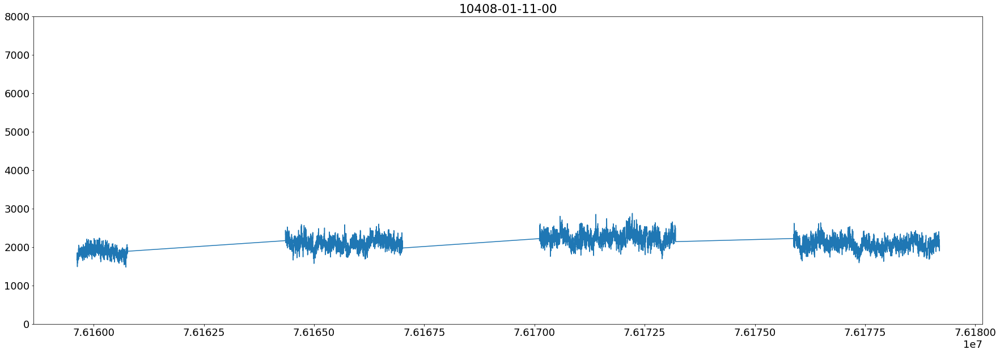

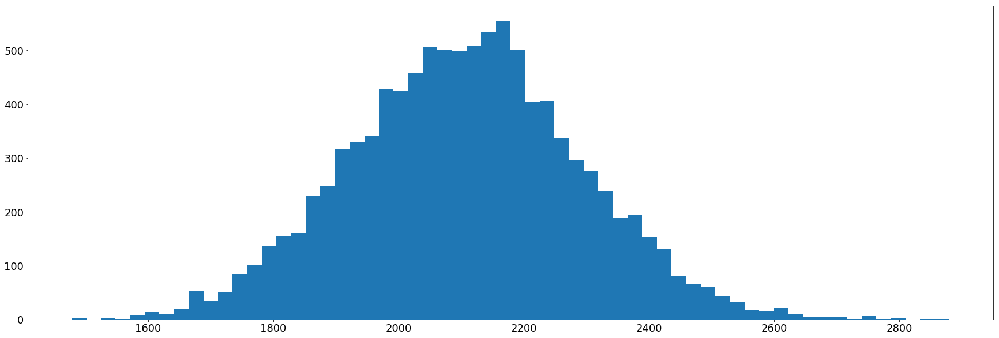

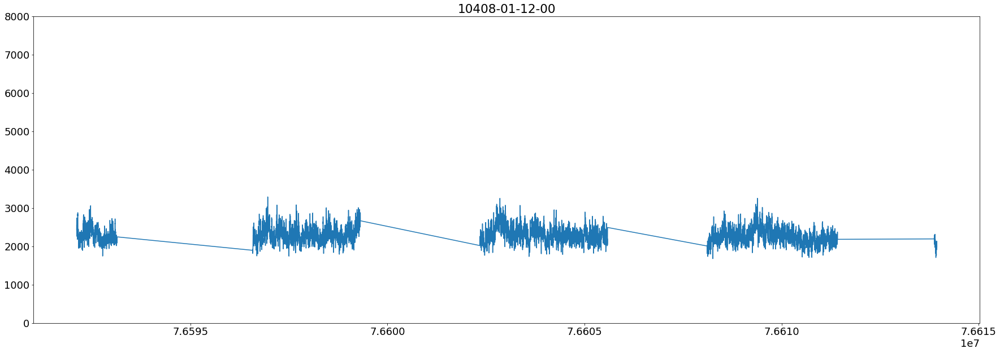

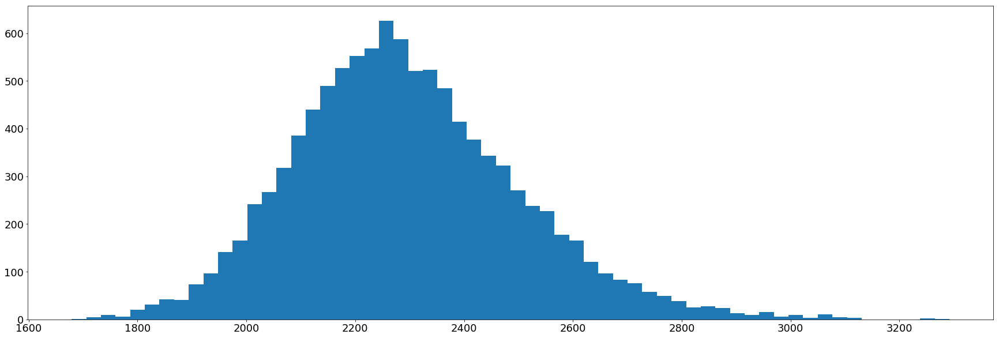

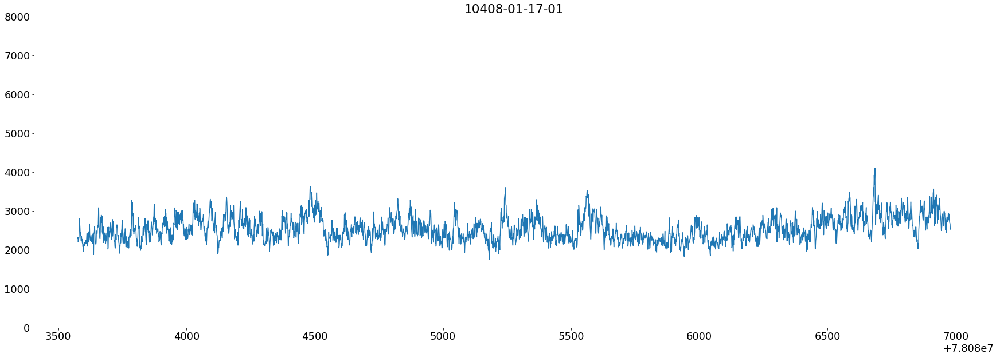

...

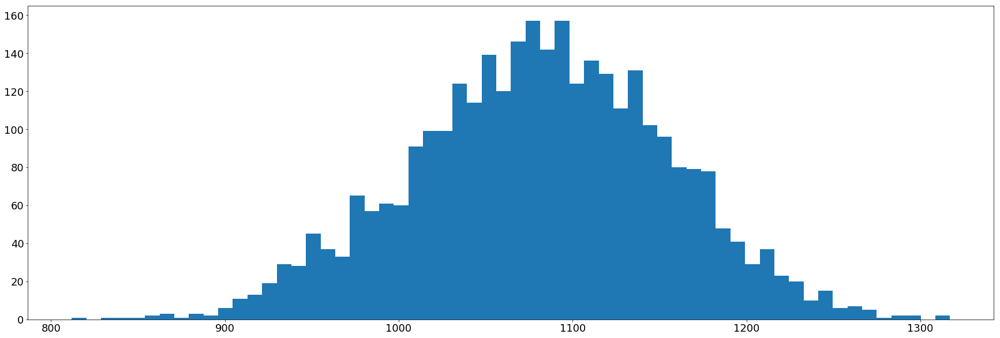

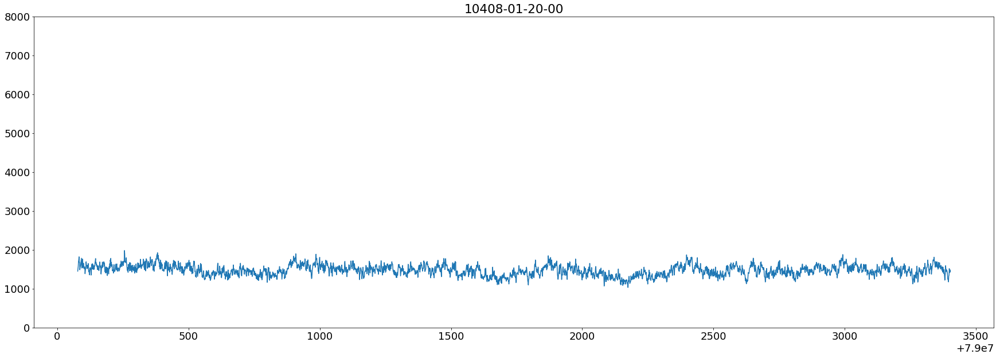

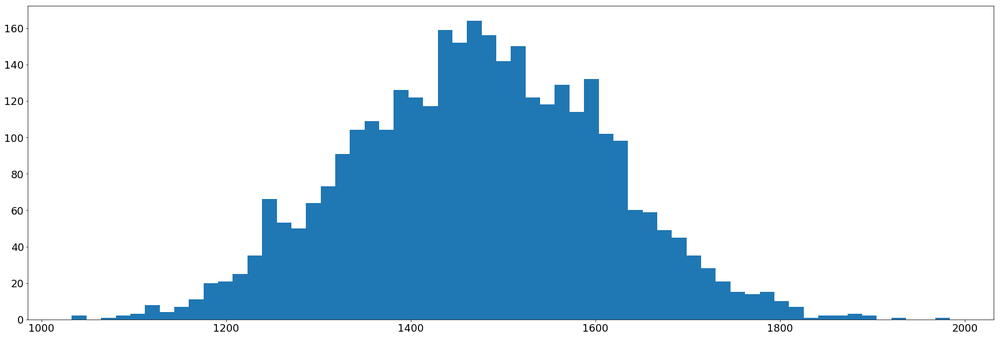

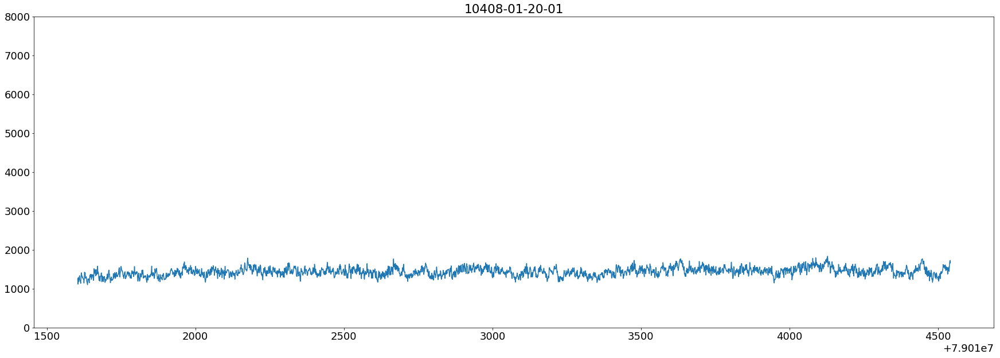

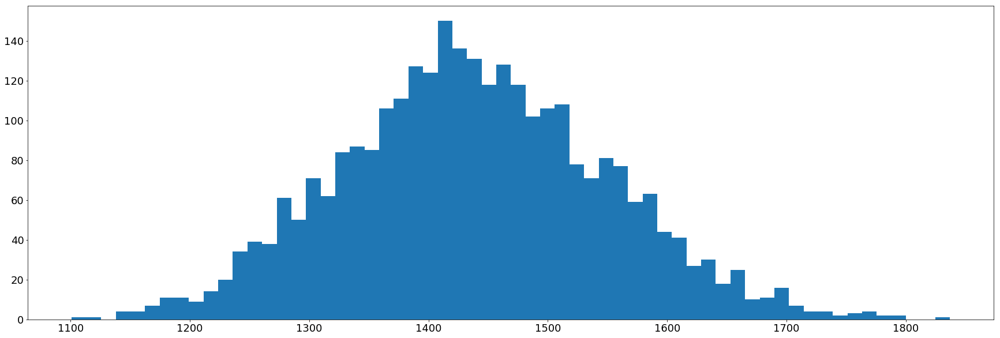

In [156]:
plt.rcParams['figure.figsize'] = (30.0, 10.0)
plt.rcParams.update({'font.size': 18})

import matplotlib.pyplot as plt
ob_list = ['20402-01-37-00', '20402-01-38-00', '20402-01-39-00','20402-01-39-02', '20402-01-55-00', '20402-01-57-00','40703-01-13-00']
ob_list2 = ['20402-01-37-00', '20402-01-37-02', '20402-01-38-00','20402-01-39-00', '20402-01-39-02', '20402-01-40-00','20402-01-55-00', '20402-01-56-00', '20402-01-57-00','40115-01-07-00', '40703-01-13-00', '40703-01-31-00']
ob_list3= ['20402-01-37-02', '20402-01-40-00', '20402-01-56-00','40115-01-07-00', '40703-01-31-00']#20402-01-37-00
for ob in belloni_clean["phi"][1:]:
    index = np.where(np.array(ids) == ob)[0][0]
    plt.plot(lcs[index][0], lcs[index][1])
    plt.title(ob)
    plt.ylim([0,8000])
    plt.show()
    plt.hist(lcs[index][1], bins=60)
    plt.show()

In [133]:
len(lcs[index][0])

1959

In [20]:
lcs_4s = []
lcs_4s_ids = []
for lc_ind, lc in enumerate(lcs):
    ###1s average and time check to eliminate points outside of GTIs
    f4t = np.mean(lc[0][:(len(lc[0])//4)*4].reshape(-1, 4), axis=1)
    f4c = np.mean(lc[1][:(len(lc[1])//4)*4].reshape(-1, 4), axis=1)
    f4e = np.mean(lc[2][:(len(lc[1])//4)*4].reshape(-1, 4), axis=1)
    rm_points = []
    skip=False
    for i in range(len(f4t)-1):
        if skip==True:
            skip=False
            continue
        delta = f4t[i+1]-f4t[i]
        if delta > 4.0:
            rm_points.append(i+1)
            skip=True

    times=np.delete(f4t,rm_points)
    counts=np.delete(f4c,rm_points)
    errors=np.delete(f4e,rm_points)
    lcs_4s.append(np.stack((times,counts, errors)))
    lcs_4s_ids.append(ids[lc_ind])

In [30]:
len(lcs_4s)

1776

In [21]:
lcs_4s[0].shape

(3, 393)

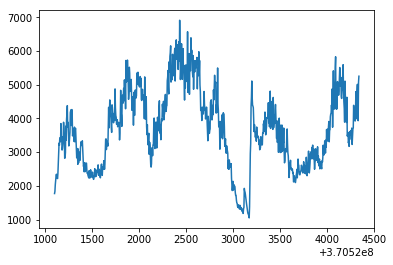

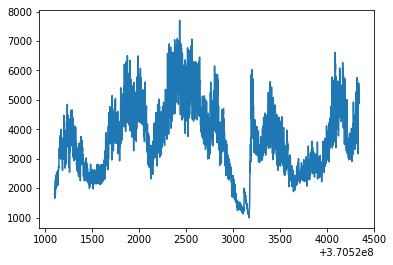

In [46]:
import matplotlib.pyplot as plt
n=600
plt.plot(lcs_4s[n][0], lcs_4s[n][1])
plt.show()
plt.plot(lcs[n][0], lcs[n][1])
plt.show()

# Sliding window segmentation, creates

In [160]:
def segmentation(time_series, seg_len, stride, keep_time_stamps=True, experimental = False):
    """
    Create a list of 1D (when time_stamps=False) or 2D (when time_stamps=True) arrays, which are overlappig segments of ts. Incomplete fragments are rejected.
    
    time_series = time series to be segmented
    seg_len = length of a segment, 
    stride = step size; difference in the starting position of the consecutive segments
    """
    
    
    segments=[]
    for start in range(0, len(time_series[0])-seg_len, stride):
        end=start+seg_len
        ############################################# *4 because of the 4 second cadance 
        if time_series[0][end]-time_series[0][start] != seg_len: #don't allow temporally discontinous segments
            continue
        if keep_time_stamps==True:
            segments.append(time_series[:,start:end])
        else:
            segments.append(time_series[1:,start:end])
    return np.array(segments) # check why time stamps are kept 


In [151]:
segments_counts=[]
segments_errors=[]
seg_ids=[]
for lc_index, lc in enumerate(lcs):
    if len(lc[1]) >= 1024: 
        segments = segmentation(lc, 1024, 64, keep_time_stamps=False, experimental = False)
    else:
        continue
    if len(segments) > 0:
        segments_counts.append(segments[:,0,:])
        segments_errors.append(segments[:,1,:])
        seg_ids.append(ids[lc_index])
        print(lc_index+1, "/{}".format(len(lcs)))
        clear_output(wait=True)

1776 /1776


In [107]:
segments_counts=[]
segments_errors=[]
seg_ids=[]
for lc_index, lc in enumerate(lcs):
    if len(lc[1]) >= 512: 
        segments = segmentation(lc, 512, 40, keep_time_stamps=False, experimental = False)
    else:
        continue
    if len(segments) > 0:
        segments_counts.append(segments[:,0,:])
        segments_errors.append(segments[:,1,:])
        seg_ids.append(ids[lc_index])
        print(lc_index+1, "/{}".format(len(lcs)))
        clear_output(wait=True)

1776 /1776


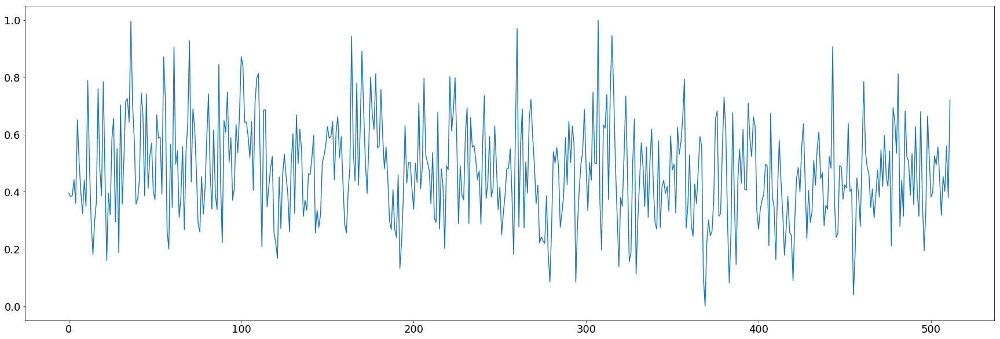

In [187]:
((np.squeeze(segments)-np.min(segments, axis=1))/(np.max(segments, axis=1)-np.min(segments, axis=1)))

In [189]:
np.expand_dims(((np.squeeze(segments)-np.min(segments, axis=1))/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1)

(94465, 512, 1)

In [161]:
with open('../../../data_GRS1915/95921_len512_s40_counts_v2.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../../data_GRS1915/95921_len512_s40_errors_v2.pkl', 'rb') as f:
    errors = pickle.load(f)
with open('../../../data_GRS1915/95921_len512_s40_ids_v2.pkl', 'rb') as f:
    seg_ids = pickle.load(f)

In [72]:
segments_counts=[]
segments_errors=[]
seg_ids=[]
for lc_index, lc in enumerate(lcs_4s):
    if len(lc[1]) >= 256:
        segments = segmentation(lc, 256, 8, keep_time_stamps=False, experimental = False)
    else:
        continue
    if len(segments) > 0:
        segments_counts.append(segments[:,0,:])
        segments_errors.append(segments[:,1,:])
        seg_ids.append(lcs_4s_ids[lc_index])
        print(lc_index+1, "/{}".format(len(lcs_4s)))
        clear_output(wait=True)

1775 /1776


In [53]:
np.where(np.array(lcs_4s_ids) == '20402-01-22-00')

(array([1654]),)

In [162]:
np.where(np.array(seg_ids) == '20402-01-34-00_0')

(array([], dtype=int64),)

In [163]:
seg_ids

['20402-01-10-00_56',
 '10408-01-01-00_83',
 '80701-01-09-00_16',
 '30703-01-24-00_85',
 '60100-01-02-00_54',
 '90105-04-01-00_26',
 '40703-01-16-03_15',
 '30183-02-02-00_237',
 '92702-01-33-00_6',
 '30703-01-08-00_72',
 '60701-01-15-00_68',
 '40703-01-18-00_73',
 '90024-02-14-00_5',
 '20402-01-52-01_8',
 '91701-01-86-01_8',
 '10408-01-41-00_0',
 '90105-04-01-00_45',
 '40703-01-03-00_170',
 '40703-01-47-00_4',
 '91701-01-85-00_5',
 '40703-01-21-01_28',
 '90701-01-10-01_9',
 '80701-01-29-02_3',
 '40703-01-06-00_189',
 '30183-02-02-01_99',
 '60100-01-03-00_141',
 '80701-01-53-01_7',
 '10408-01-40-00_13',
 '91412-01-01-00_30',
 '20186-03-02-06_26',
 '40703-01-47-00_96',
 '91701-01-18-00_8',
 '20186-03-02-050_119',
 '30703-01-15-00_4',
 '80701-01-12-00_4',
 '80701-01-06-00_51',
 '20402-01-01-00_19',
 '90105-10-01-00_42',
 '50703-01-58-00_54',
 '30402-01-14-00_75',
 '96378-01-01-02_175',
 '60702-01-01-14_31',
 '90105-10-04-00_5',
 '95701-01-12-00_10',
 '94701-01-61-01_70',
 '20187-02-05-00_

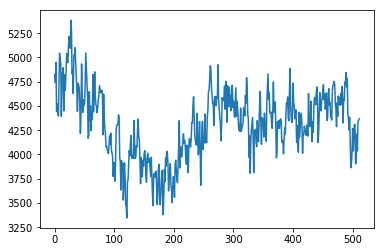

In [102]:
plt.plot(segments[63315])

In [51]:
ob_state

NameError: name 'ob_state' is not defined

In [50]:
seg_ids

['50703-01-06-02',
 '60701-01-27-00',
 '60405-01-02-00',
 '40117-01-01-00',
 '40403-01-05-00',
 '80127-03-01-00',
 '30703-01-35-00',
 '20402-01-12-00',
 '40703-01-06-00',
 '90701-01-25-00',
 '50703-01-41-00',
 '20402-01-06-00',
 '80188-01-01-01',
 '93701-01-14-00',
 '80127-02-03-00',
 '20402-01-50-00',
 '80701-01-13-03',
 '60701-01-01-01',
 '80701-01-11-00',
 '90105-05-03-02',
 '40116-01-02-04',
 '91701-01-86-00',
 '60701-01-15-00',
 '50703-01-11-00',
 '92702-01-20-00',
 '90105-03-02-02',
 '40703-01-43-00',
 '20402-01-04-00',
 '70702-01-21-00',
 '80701-01-45-01',
 '50703-01-51-01',
 '20186-03-02-000',
 '94701-01-21-00',
 '40703-01-22-01',
 '90701-01-08-00',
 '50703-01-29-00',
 '30703-01-33-00',
 '40703-01-03-00',
 '80701-01-20-00',
 '20402-01-58-00',
 '70702-01-18-00',
 '96701-01-13-00',
 '40703-01-36-02',
 '50703-01-60-00',
 '70702-01-20-00',
 '90701-01-19-00',
 '70702-01-55-00',
 '20402-01-32-00',
 '90108-01-04-00',
 '80701-01-62-02',
 '10408-01-19-02',
 '90701-01-26-00',
 '96701-01-

# (Load pre-processed light curve segments) 

# stack the segments list of lists to shape \[no_segments, segment_len\]

In [108]:
id_per_seg = []  # for each light curve, copy the observation id for every segment of the light curve
for lc_index, lc in enumerate(segments_counts):
    for i in range(len(lc)):
        id_per_seg.append(seg_ids[lc_index]+"_{}".format(i))
        
segments_counts=np.vstack(segments_counts)
segments_errors=np.vstack(segments_errors)
segments_counts = np.expand_dims(segments_counts, axis=-1)
segments_errors = np.expand_dims(segments_errors, axis=-1)

In [109]:
segments_counts.shape

(94465, 512, 1)

In [110]:
rng_state = np.random.get_state()
np.random.shuffle(segments_counts)
np.random.set_state(rng_state)
np.random.shuffle(segments_errors)
np.random.set_state(rng_state)
np.random.shuffle(id_per_seg)

In [115]:
# 95921_len512_s40_counts.pkl

# with open('../../../data_GRS1915/80258_len256_stride8_4sec_counts.pkl', 'wb') as f:
#     pickle.dump(segments_counts, f)
    
# with open('../../../data_GRS1915/80258_len256_stride8_4sec_errors.pkl', 'wb') as f:
#     pickle.dump(segments_errors, f)
    
# with open('../../../data_GRS1915/80258_len256_stride8_4sec_ids.pkl', 'wb') as f:
#     pickle.dump(id_per_seg, f)
    
with open('../../../data_GRS1915/94465_len512_s40_counts.pkl', 'wb') as f:
    pickle.dump(segments_counts, f)
    
with open('../../../data_GRS1915/94465_len512_s40_errors.pkl', 'wb') as f:
    pickle.dump(segments_errors, f)
    
with open('../../../data_GRS1915/94465_len512_s40_ids.pkl', 'wb') as f:
    pickle.dump(id_per_seg, f)

In [ ]:
# with open('for_snuffy/48610_len1024_s64_counts.pkl', 'wb') as f:
#     pickle.dump(segments_counts, f)
    
# with open('for_snuffy/48610_len1024_s64_errors.pkl', 'wb') as f:
#     pickle.dump(segments_errors, f)
    
# with open('for_snuffy/48610_len1024_s64_ids.pkl', 'wb') as f:
#     pickle.dump(id_per_seg, f)

In [29]:
with open('for_snuffy/95921_len512_s40_counts.pkl', 'wb') as f:
    pickle.dump(segments_counts, f)
    
with open('for_snuffy/95921_len512_s40_errors.pkl', 'wb') as f:
    pickle.dump(segments_errors, f)
    
with open('for_snuffy/95921_len512_s40_ids.pkl', 'wb') as f:
    pickle.dump(id_per_seg, f)

In [159]:
print(np.mean(segments_counts), np.var(segments_counts), np.mean(segments_errors), np.var(segments_errors))

2469.3273597615266 2044398.2169343089 135.0995833020897 1438.0827397363157


In [95]:
np.where(np.array(id_per_seg) == '20402-01-22-00_1')

(array([93826]),)

['60702-01-01-11_29',
 '70702-01-08-00_2',
 '30183-02-01-01_32',
 '70702-01-25-01_5',
 '91701-01-55-00_201',
 '70702-01-18-01_10',
 '50703-01-50-00_5',
 '10408-01-41-00_38',
 '80701-01-54-01_16',
 '90105-09-01-00_9',
 '20402-01-53-00_1',
 '91701-01-05-00_9',
 '40403-01-05-02_11',
 '20186-03-01-04_12',
 '10408-01-11-00_13',
 '95701-01-25-01_23',
 '90105-03-02-00_25',
 '60701-01-23-01_26',
 '50125-01-01-01_37',
 '80701-01-08-00_38',
 '70703-01-01-08_216',
 '20402-01-44-00_90',
 '96378-01-01-00_110',
 '60405-01-02-00_245',
 '90105-04-01-00_76',
 '40703-01-15-01_30',
 '20402-01-46-00_47',
 '50703-01-02-01_4',
 '40116-01-01-00_11',
 '20186-03-01-03_9',
 '50125-01-01-03_35',
 '94701-01-56-00_28',
 '50703-01-64-00_50',
 '20402-01-37-00_2',
 '50405-01-02-01_36',
 '70703-01-01-09_18',
 '80701-01-45-01_6',
 '95701-01-33-00_22',
 '40117-01-01-03_49',
 '40116-01-07-00_65',
 '90105-04-01-00_64',
 '90105-06-01-00_92',
 '90105-07-01-00_32',
 '10258-01-09-00_198',
 '70702-01-02-00_37',
 '10408-01-28-0

# Sliding window segmentation of size 500, stride 50

In [66]:
segments=[]
seg_ids=[]
for lc_index, lc in enumerate(lcs):
    if len(lc[1]) >= 500: 
        segments.append(segmentation(lc[1], 500, 50, time_stamps=False, experimental = True))
        seg_ids.append(ids[lc_index])
        print(lc_index)
        clear_output(wait=True)

1775


In [67]:
np.shape(segments)

(1752,)

In [68]:
with open('series_1752_500_stride50.pkl', 'wb') as f:
    pickle.dump(segments, f)
    
with open('series_1752_500_stride50_ids.pkl', 'wb') as f:
    pickle.dump(seg_ids, f)

# Sliding window segmentation of size 250, stride 25

In [69]:
segments=[]
seg_ids=[]
for lc_index, lc in enumerate(lcs):
    if len(lc[1]) >= 250: 
        segments.append(segmentation(lc[1], 250, 25, time_stamps=False, experimental = True))
        seg_ids.append(ids[lc_index])
        print(lc_index)
        clear_output(wait=True)

1775


In [70]:
np.shape(segments)

(1775,)

In [71]:
with open('series_1755_250_stride25.pkl', 'wb') as f:
    pickle.dump(segments, f)
    
with open('series_1755_250_stride25_ids.pkl', 'wb') as f:
    pickle.dump(seg_ids, f)

# (Load pre-processed light curve segments) 

# stack the segments list of lists to shape \[no_segments, segment_len\]

In [76]:
with open('series_1755_250_stride25.pkl', 'rb') as f:
    segments = pickle.load(f)
    
with open('series_1755_250_stride25_ids.pkl', 'rb') as f:
    seg_ids = pickle.load(f)
    
id_per_seg = []  # for each light curve, copy the observation id for every segment of the light curve
for lc_index, lc in enumerate(segments):
    for i in range(len(lc)):
        id_per_seg.append(seg_ids[lc_index])
        
segments=np.vstack(segments)
segments = np.reshape(segments, (segments.shape[0], segments.shape[1], 1))

In [77]:
np.shape(segments)

(187162, 250, 1)

In [78]:
rng_state = np.random.get_state()
np.random.shuffle(segments)
np.random.set_state(rng_state)
np.random.shuffle(id_per_seg)

In [79]:
with open('for_snuffy/series_187162_250_stride25.pkl', 'wb') as f:
    pickle.dump(segments, f)
    
with open('for_snuffy/series_187162_250_stride25_ids.pkl', 'wb') as f:
    pickle.dump(id_per_seg, f)

# Standardize and shuffle, or load pre-shuffled

In [49]:
len(id_per_seg)

43023

In [271]:
# segments = zscore(segments)

rng_state = np.random.get_state()
np.random.shuffle(segments)
np.random.set_state(rng_state)
np.random.shuffle(seg_ids)

In [38]:
# with open('for_snuffy/series_34697_1000.pkl', 'rb') as f:
#     segments = pickle.load(f)
    
# with open('for_snuffy/series_34697_1000_ids.pkl', 'rb') as f:
#     seg_ids = pickle.load(f)
    
# segments = zscore(segments)


with open('for_snuffy/series_43023_500.pkl', 'rb') as f:
    segments = pickle.load(f)
    
with open('for_snuffy/series_43023_500_ids.pkl', 'rb') as f:
    seg_ids = pickle.load(f)
    
segments = zscore(segments)

# Load classifications from Huppenkothen 2017

In [13]:
clean_belloni = open('../../1915Belloniclass_updated.dat')
lines = clean_belloni.readlines()
states = lines[0].split()
belloni_clean = {}
for h,l in zip(states, lines[1:]):
    belloni_clean[h] = l.split()
    #state: obsID1, obsID2...
ob_state = {}
for state, obs in belloni_clean.items():
    if state == "chi1" or state == "chi2" or state == "chi3" or state == "chi4": state = "chi"
    for ob in obs:
        ob_state[ob] = state

# train model

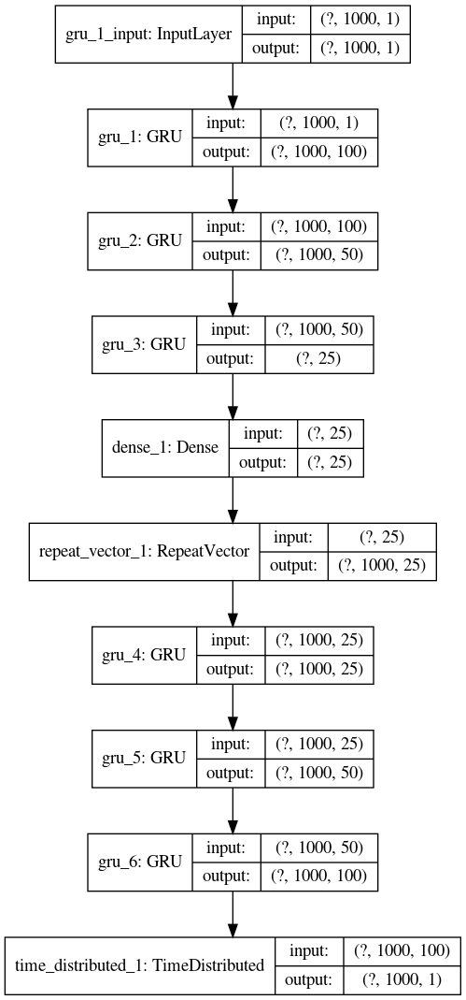

In [14]:
plot_model(deep_model, show_shapes=True)

In [82]:
import pickle
from scipy.stats import zscore

with open('for_snuffy/series_43023_500.pkl', 'rb') as f:
    segments = pickle.load(f)
    
with open('for_snuffy/series_43023_500_ids.pkl', 'rb') as f:
    seg_ids = pickle.load(f)
    
segments = zscore(segments)

In [84]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU
from tensorflow.keras.layers import CuDNNGRU
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
import numpy as np
np.random.seed(seed=11)

deep_model = Sequential(name="LSTM-autoencoder")
deep_model.add(GRU(80, input_shape=(500,1),reset_after=True, return_sequences=False, recurrent_activation='sigmoid'))
deep_model.add(Dense(20, activation=None))
deep_model.add(RepeatVector(500))
deep_model.add(GRU(80, return_sequences=True,reset_after=True, recurrent_activation='sigmoid'))
deep_model.add(TimeDistributed(Dense(1)))


In [ ]:
encoder_inputs = Input(shape=(None, 100))
encoder = GRU(latent_dim, return_state=True)
encoder_outputs, state_h = encoder(encoder_inputs)

decoder_inputs = Input(shape=(None, num_decoder_tokens))
decoder_gru = GRU(latent_dim, return_sequences=True)
decoder_outputs = decoder_gru(decoder_inputs, initial_state=state_h)
decoder_dense = Dense(num_decoder_tokens, activation='softmax')
decoder_outputs = decoder_dense(decoder_outputs)
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)


In [260]:
deep_model.summary()

Model: "LSTM-autoencoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_1 (GRU)                  (None, 100)               30600     
_________________________________________________________________
dense_1 (Dense)              (None, 20)                2020      
_________________________________________________________________
repeat_vector_1 (RepeatVecto (None, 1000, 20)          0         
_________________________________________________________________
gru_2 (GRU)                  (None, 1000, 100)         36300     
_________________________________________________________________
time_distributed (TimeDistri (None, 1000, 1)           101       
Total params: 69,021
Trainable params: 69,021
Non-trainable params: 0
_________________________________________________________________


In [85]:
deep_model.load_weights('lstm_autoencoder_2020-01-14_17-50-32.h5')

In [92]:
reco = deep_model.predict(np.reshape(segments[:20], (20,500,1)).astype(np.float32))

In [107]:
mse= np.mean((reco-np.reshape(segments[:20], (20,500,1)).astype(np.float32))**2)

In [108]:
mse

0.057424232

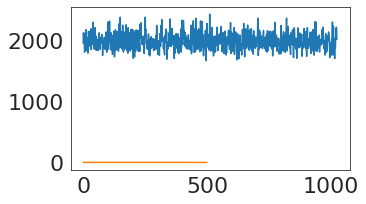

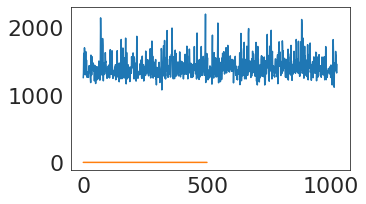

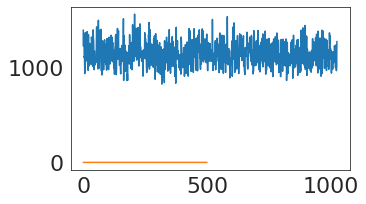

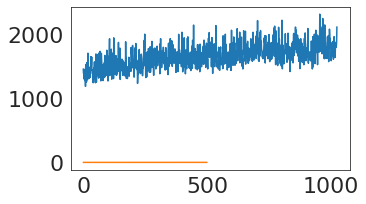

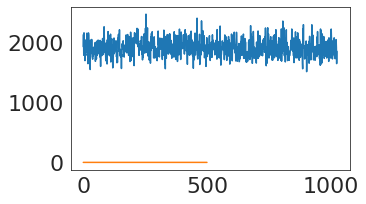

...

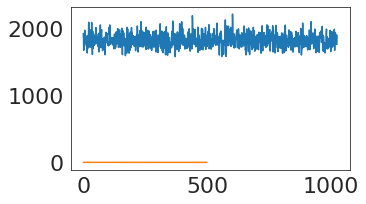

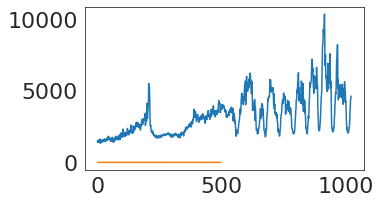

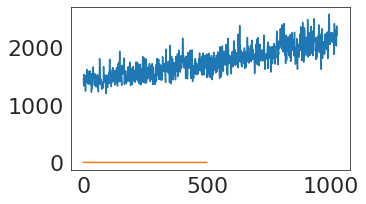

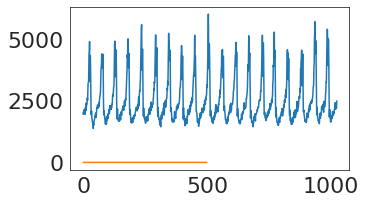

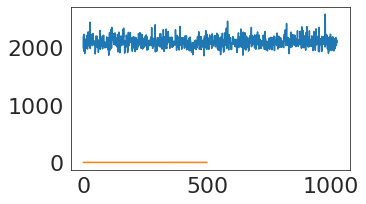

In [182]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (5.0, 3.0)
for lc_index, lc in enumerate(reco):
    #plt.ylim([-5,5])
    plt.plot(segments[lc_index])
    plt.plot(lc)
    plt.show()

In [7]:
import pickle
with open('../../data/95921_len512_s40_counts.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../data/95921_len512_s40_errors.pkl', 'rb') as f:
    errors = pickle.load(f)
with open('../../data/95921_len512_s40_ids.pkl', 'rb') as f:
    seg_ids = pickle.load(f)

In [87]:
deep_model.layers[:2]

In [88]:
encoded_segments = np.zeros((len(segments), 20), dtype=np.float32)

encoder = Sequential(deep_model.layers[:2])

for seg_index, segment in enumerate(segments):
    code = encoder.predict(np.reshape(segment, (1,500,1)).astype(np.float32))
    encoded_segments[seg_index] = code
    print(seg_index+1, "/", len(segments))
    clear_output(wait=True)

43023 / 43023


In [18]:
encoder = Sequential(deep_model.layers[:5])

In [81]:
np.sqrt(0.08238)

0.2870191631233009

In [89]:
with open('encoded_segments_weights_2020-01-14_17-50-32_series_43023_500.pkl', 'wb') as f:
    pickle.dump(encoded_segments, f)

In [36]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(encoded_segments)
transformed_encoded = pca.transform(encoded_segments)

In [37]:
pca.explained_variance_ratio_

array([0.37331215, 0.310116  , 0.05909716], dtype=float32)

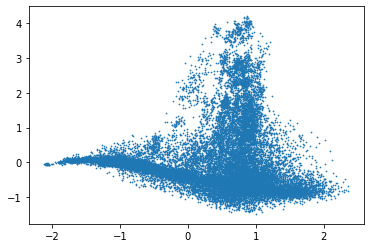

In [39]:

plt.scatter(transformed_encoded[:,0], transformed_encoded[:,1], s=0.5)
plt.show()

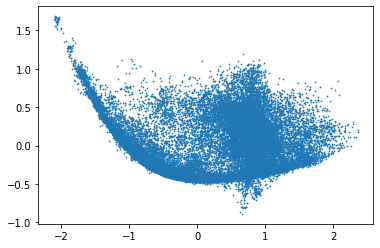

In [40]:
plt.scatter(transformed_encoded[:,0], transformed_encoded[:,2], s=0.5)
plt.show()

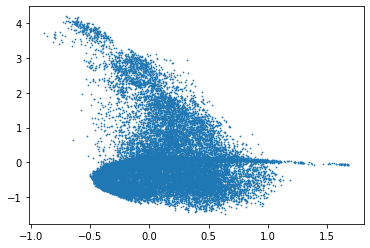

In [41]:
plt.scatter(transformed_encoded[:,2], transformed_encoded[:,1], s=0.5)
plt.show()

In [3]:
with open('encoded_segments_2019-12-18_11-48-01_weights.pkl', 'rb') as f:
    encoded_segments = pickle.load(f)

In [ ]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, perplexity=2).fit_transform(encoded_segments)

In [ ]:
plt.plot(X_embedded[:,0], X_embedded[:,1])  # perplexity=2
plt.show()

In [4]:
import umap

embedding = umap.UMAP(metric='correlation').fit_transform(encoded_segments)

/home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/ae-env/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for hel

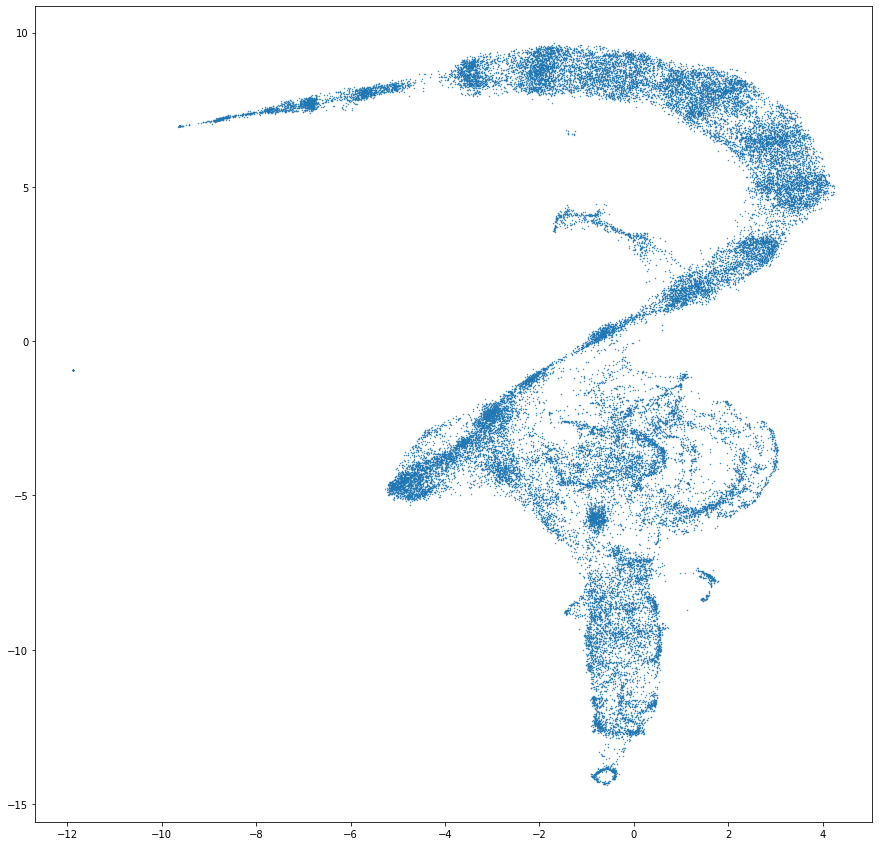

In [10]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (15.0, 15.0)
plt.scatter(embedding[:,0], embedding[:,1], s=0.2)

In [11]:
embedding = umap.UMAP(n_neighbors=100,
                      min_dist=0.2,
                      metric='correlation').fit_transform(encoded_segments)

/home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/ae-env/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


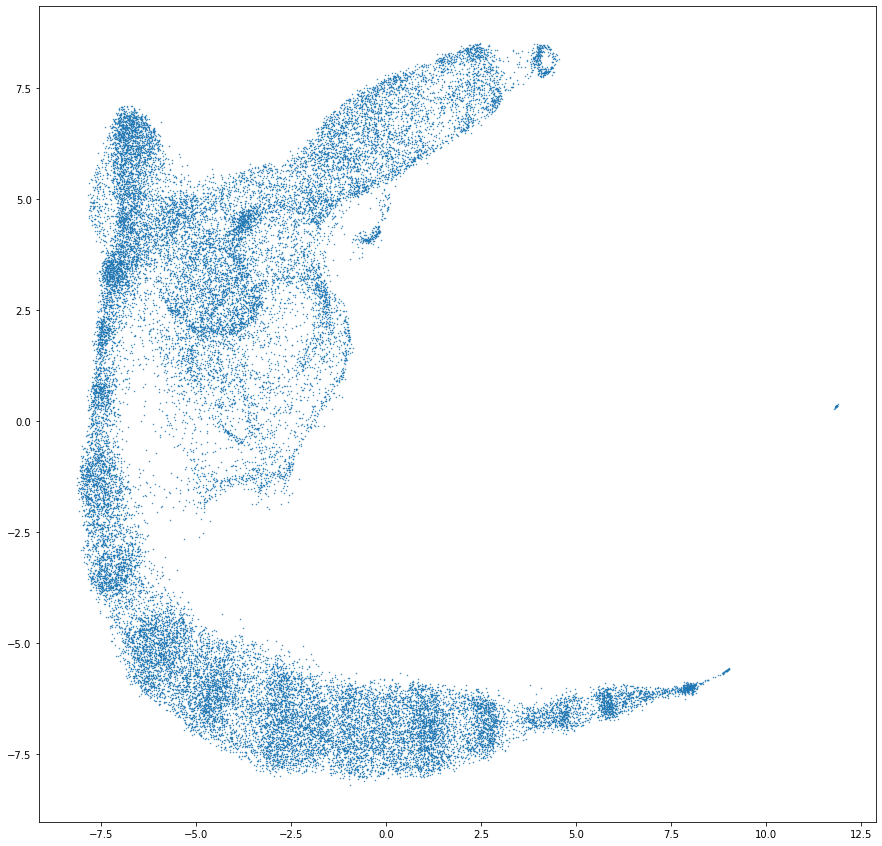

In [12]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (15.0, 15.0)
plt.scatter(embedding[:,0], embedding[:,1], s=0.2)

In [6]:
import umap
embedding = umap.UMAP(n_neighbors=1000,
                      min_dist=0.3,
                      metric='correlation').fit_transform(encoded_segments)

/home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/ae-env/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for hel

In [8]:
paper_obIDs = np.loadtxt("Belloni_Altamirano_obsIDs.txt", dtype=str)

OSError: Belloni_Altamirano_obsIDs.txt not found.

In [10]:
paper_obIDs

array(['10408-01-01-01', '10408-01-03-00', '10408-01-04-00',
       '10408-01-05-00', '10408-01-06-00', '10408-01-07-00',
       '10258-01-10-00', '20186-03-01-03', '20186-03-01-04',
       '20402-01-38-00', '20402-01-39-00', '20402-01-39-02',
       '20402-01-41-02', '20402-01-54-00', '20402-01-55-00',
       '20402-01-56-00', '20402-01-57-01', '20402-01-58-01',
       '20402-01-60-00', '30703-01-01-00', '30402-01-01-00',
       '40403-01-06-00', '40703-01-12-00', '40403-01-07-00',
       '40703-01-13-01', '40703-01-26-00', '40703-01-28-00',
       '40703-01-28-02', '40703-01-29-00', '40703-01-29-01',
       '40703-01-29-02', '40703-01-31-00', '50703-01-10-02',
       '50703-01-60-03', '50703-01-61-01', '60701-01-09-00',
       '70702-01-55-00', '80701-01-28-00', '80701-01-28-01',
       '80701-01-28-02', '80127-04-02-00', '80701-01-31-00',
       '90105-08-02-00', '90701-01-38-00', '91701-01-12-00',
       '91701-01-12-01', '92092-03-01-00', '93701-01-01-00',
       '93701-01-06-00',

In [27]:
# paper_obIDs = np.array(['10408-01-01-01', '10408-01-03-00', '10408-01-04-00',
#        '10408-01-05-00', '10408-01-06-00', '10408-01-07-00',
#        '10258-01-10-00', '20186-03-01-03', '20186-03-01-04',
#        '20402-01-38-00', '20402-01-39-00', '20402-01-39-02',
#        '20402-01-41-02', '20402-01-54-00', '20402-01-55-00',
#        '20402-01-56-00', '20402-01-57-01', '20402-01-58-01',
#        '20402-01-60-00', '30703-01-01-00', '30402-01-01-00',
#        '40403-01-06-00', '40703-01-12-00', '40403-01-07-00',
#        '40703-01-13-01', '40703-01-26-00', '40703-01-28-00',
#        '40703-01-28-02', '40703-01-29-00', '40703-01-29-01',
#        '40703-01-29-02', '40703-01-31-00', '50703-01-10-02',
#        '50703-01-60-03', '50703-01-61-01', '60701-01-09-00',
#        '70702-01-55-00', '80701-01-28-00', '80701-01-28-01',
#        '80701-01-28-02', '80127-04-02-00', '80701-01-31-00',
#        '90105-08-02-00', '90701-01-38-00', '91701-01-12-00',
#        '91701-01-12-01', '92092-03-01-00', '93701-01-01-00',
#        '93701-01-06-00', '93411-01-01-00', '95701-01-20-00'], dtype='<U14')

In [28]:
qpo_colours = []

for seg_id in seg_ids:
    if seg_id.split("_")[0] in paper_obIDs:
        qpo_colours.append("red")
    else:
        qpo_colours.append("grey")
        

In [29]:
qpo_labels = []

for seg_id in seg_ids:
    if seg_id.split("_")[0] in paper_obIDs:
        qpo_labels.append("QPO")
    else:
        qpo_labels.append("other")
        

In [30]:
qpo_scales = []

for seg_id in seg_ids:
    if seg_id.split("_")[0] in paper_obIDs:
        qpo_scales.append("QPO")
    else:
        qpo_scales.append("other")
        

In [31]:
seg_id.split("_")[0]

'95701-01-13-00'

In [32]:
"10408-01-01-01_13".split("_")[0] in paper_obIDs

True

In [33]:
len(paper_obIDs)

51

In [9]:
xxx = [seg.split("_")[0] for seg in seg_ids]

In [14]:
classes = np.array(["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"])
class_colour = []
for ob in xxx:
    if ob in ob_state:
        class_colour.append(np.where(classes == ob_state[ob])[0][0])
    else:
        class_colour.append(15)

In [15]:
classes = np.array(["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"])
scales = []
class_name = []
for ob in xxx:
    if ob in ob_state:
        class_name.append(ob_state[ob])
        scales.append(5)
    else:
        class_name.append("Unknown")
        scales.append(0.1)

In [ ]:
import matpl

In [16]:
from matplotlib import cm
cm.get_cmap(plt.get_cmap("Set1"))

NameError: name 'plt' is not defined

In [38]:
count=0
for i in paper_obIDs:
    if i in xxx:
        count+=1
        
count

49

In [2]:
import numpy as np
embeddings_lap  = np.loadtxt("../../embedding_50n_0dist.csv", delimiter=",")

In [17]:
import matplotlib.colors as mcolors
colours = mcolors.CSS4_COLORS.items()
colours_tuple = tuple(colours)

In [18]:
# colours = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000']
colours = ['#ffd8b1', '#000075', '#808080', '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#000000']

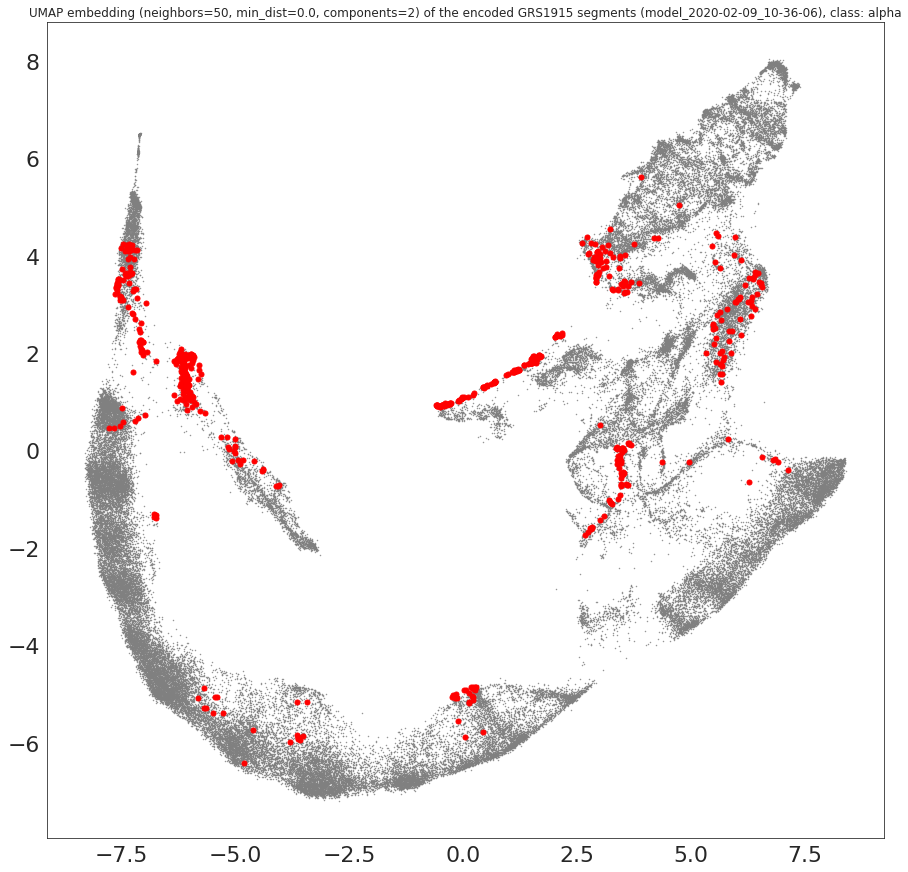

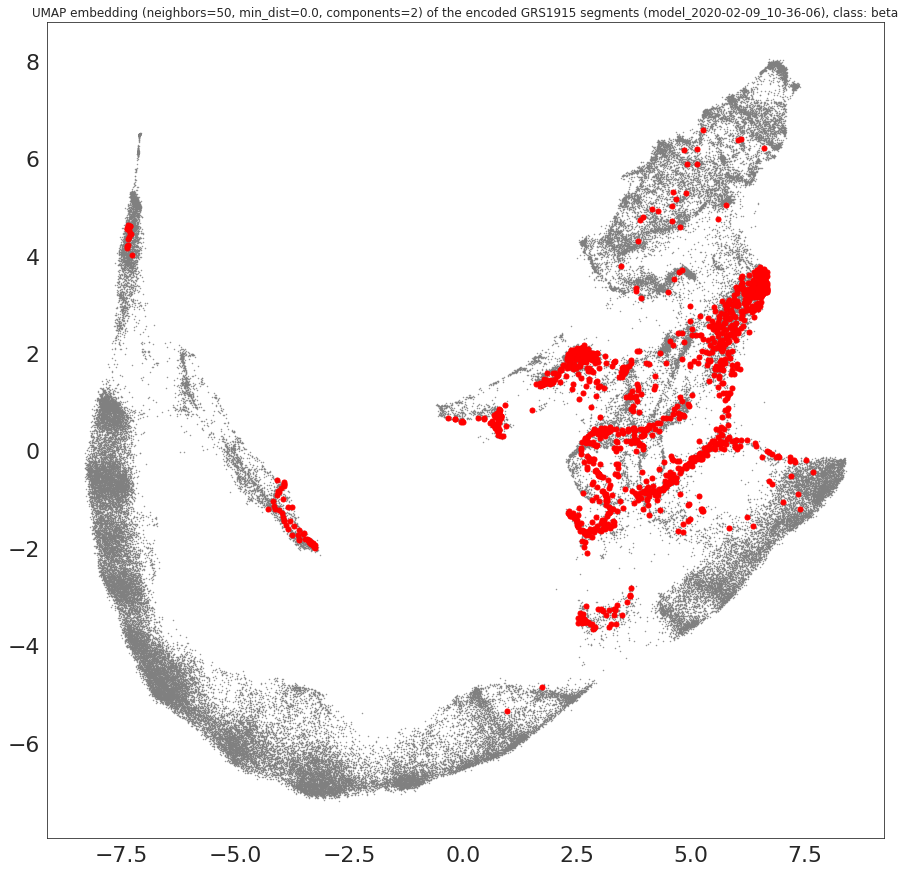

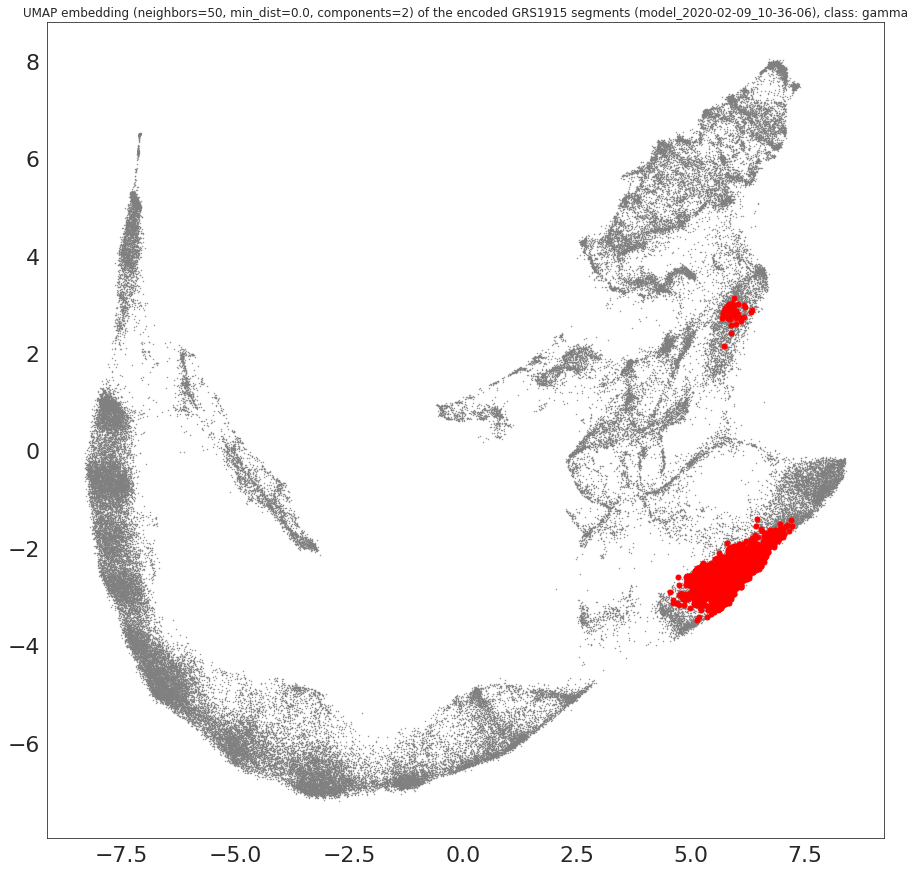

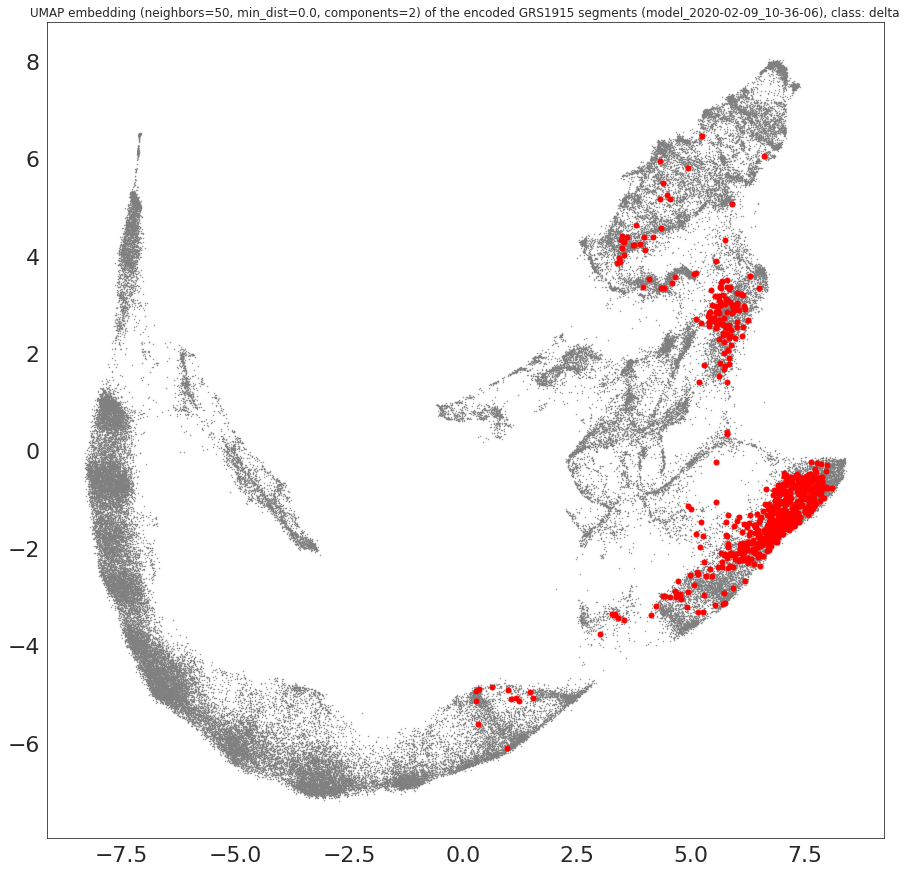

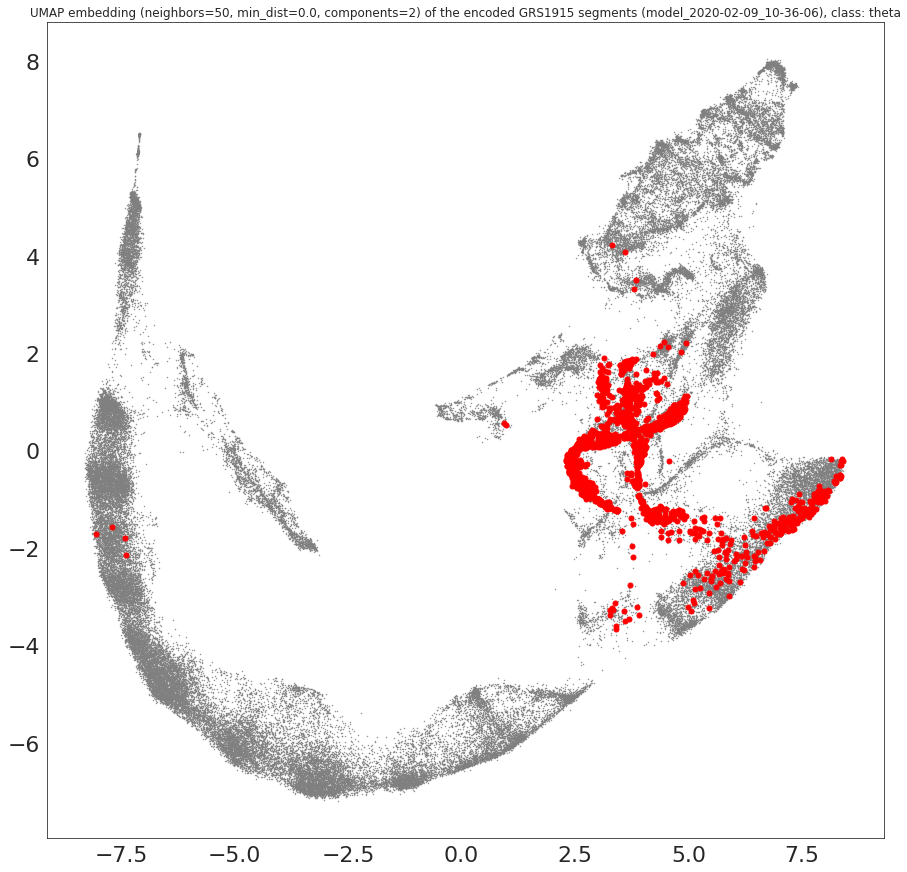

...

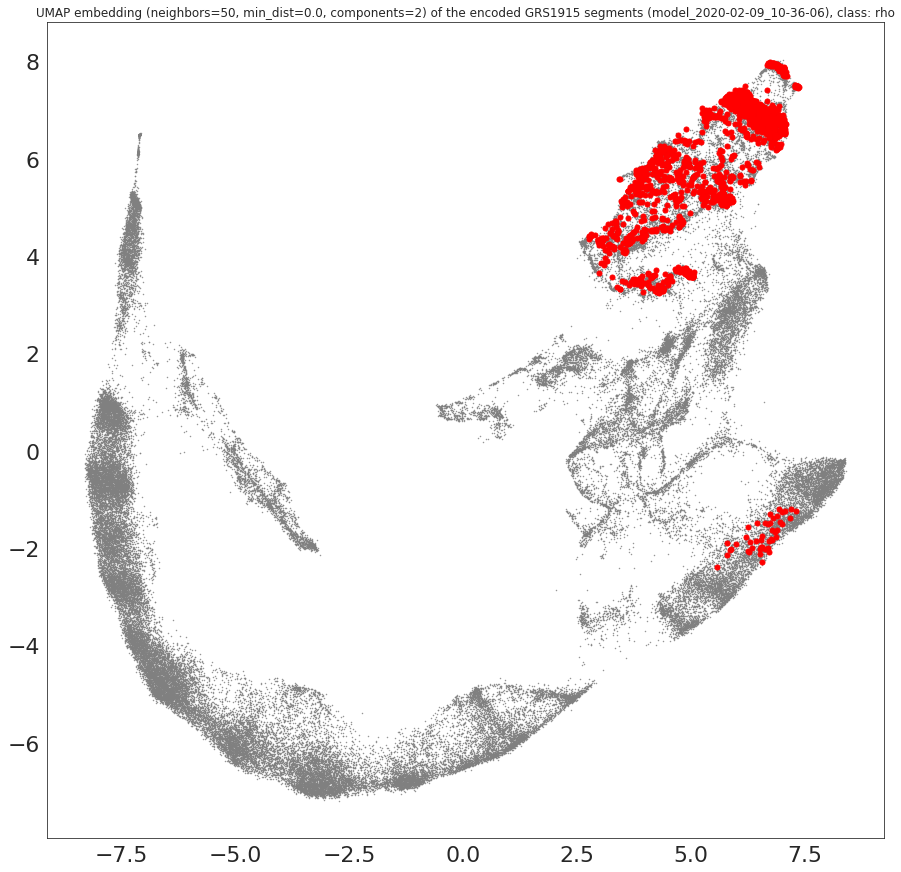

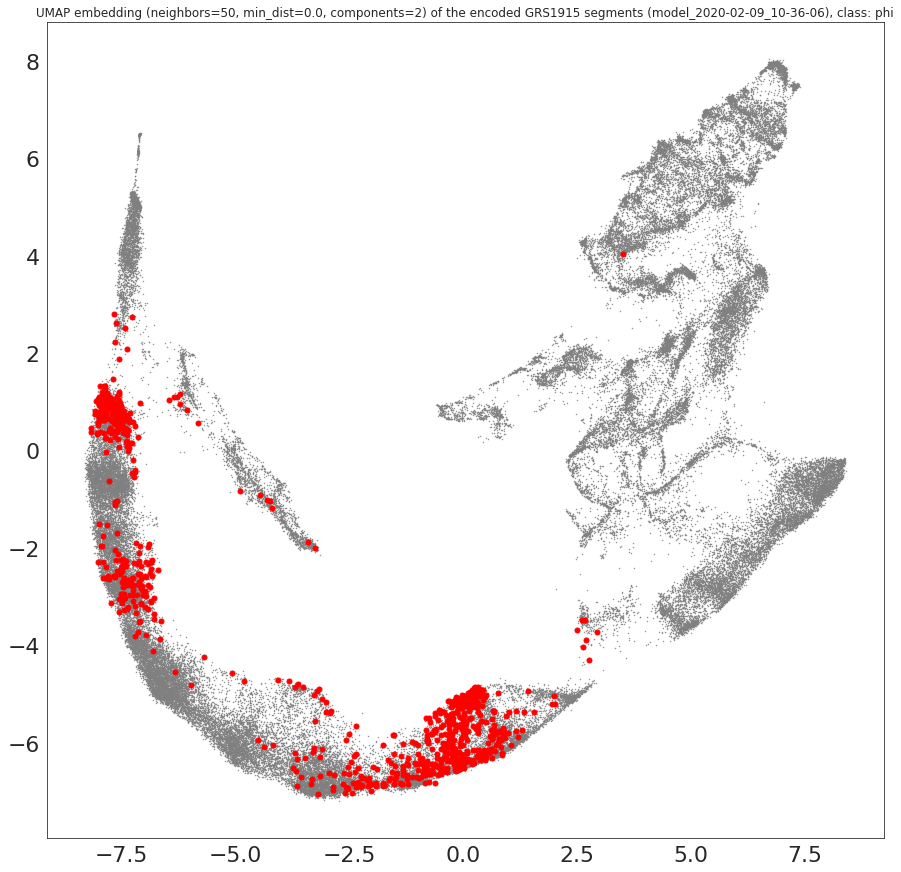

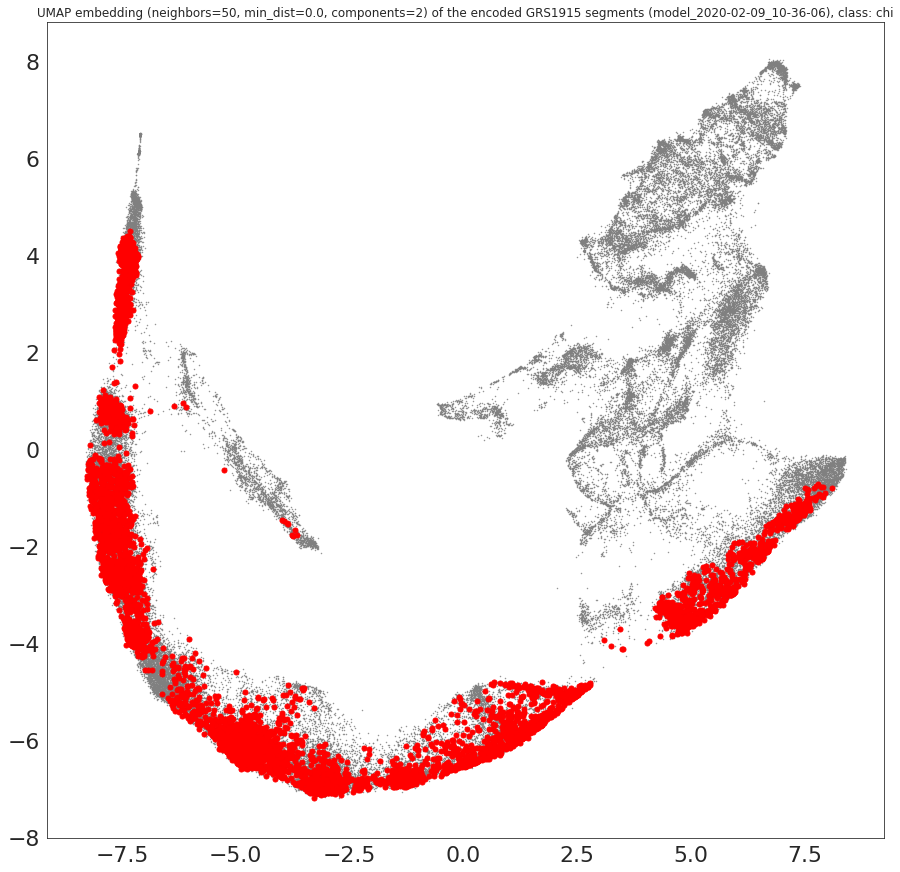

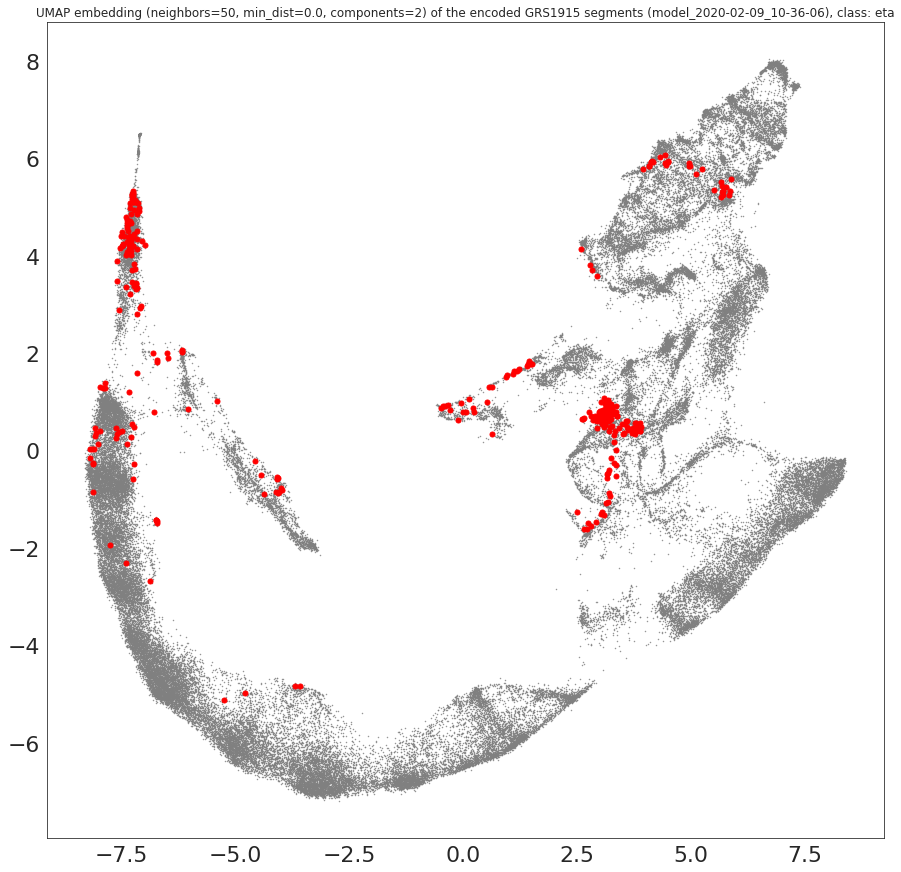

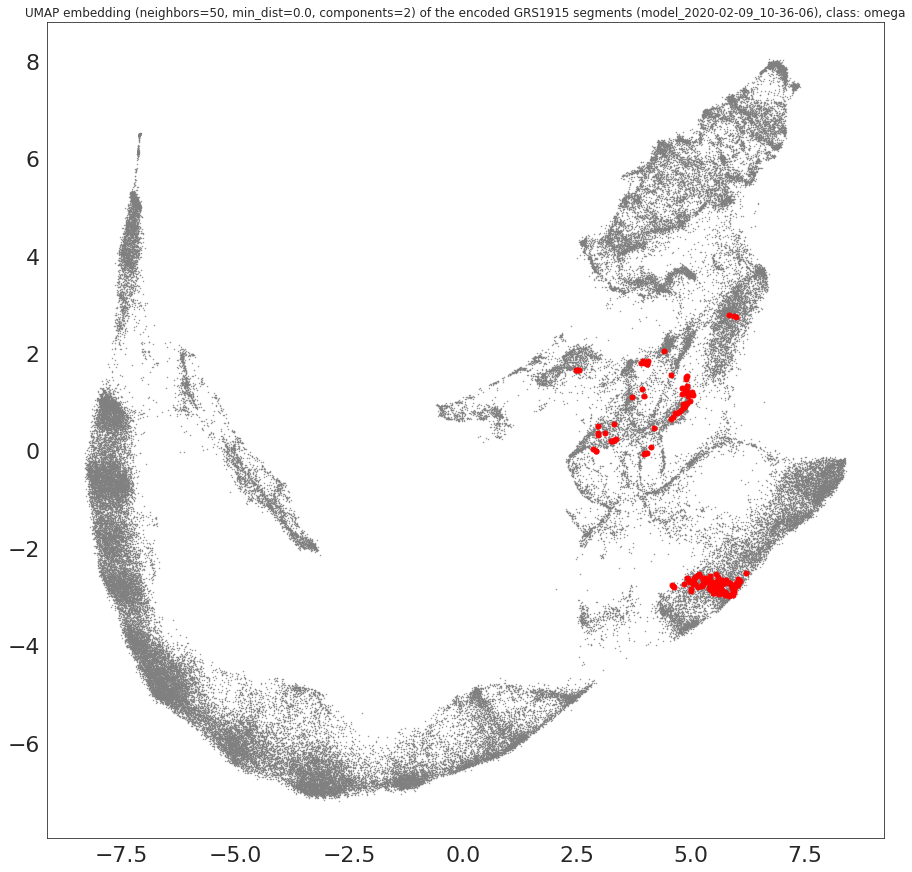

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
sns.set_style("white")
plt.rcParams['figure.figsize'] = (15.0, 15.0)
plt.rcParams.update({'font.size': 22})

# fig, ax = plt.subplots()
class_indices = np.where(np.array(class_name) == "Unknown")[0]
class_data_unknown = embeddings_lap[class_indices]

for plot_class_ind, plot_class in enumerate(classes):
    plt.scatter(class_data_unknown[:,0], class_data_unknown[:,1], s = 0.2, c="grey", label="Unknown")
    class_indices = np.where(np.array(class_name) == plot_class)[0]
    class_data = embeddings_lap[class_indices]
    
    #plt.scatter(class_data[:,0], class_data[:,1], s = 25, c=colours[plot_class_ind], label=plot_class)
    plt.scatter(class_data[:,0], class_data[:,1], s = 25, c="red", label=plot_class)
    
    
# plt.legend()
    plt.title("UMAP embedding (neighbors=50, min_dist=0.0, components=2) of the encoded GRS1915 segments (model_2020-02-09_10-36-06), class: {}".format(plot_class), fontsize=12)
    plt.show()

# scatter = ax.scatter(embedding[:,0], embedding[:,1], s=scales, c=class_colour, label= class_name)
#ax.title("UMAP embedding of the encoded GRS1915 segments (model 2019-21-18_11-48-01), neighbors=1000, min_dist=0.3, components=2", fontsize=12)
# handles, labels = scatter.legend_elements(prop="colors", alpha=0.6)
# legend2 = ax.legend(handles, labels, loc="upper right", title="Classes")
# legend1 = ax.legend(*scatter.legend_elements(),
#                     loc="upper left", title="Classes")
# plt.savefig("umap_on_features_2019-12-18_11-48-01.png")
# plt.show()

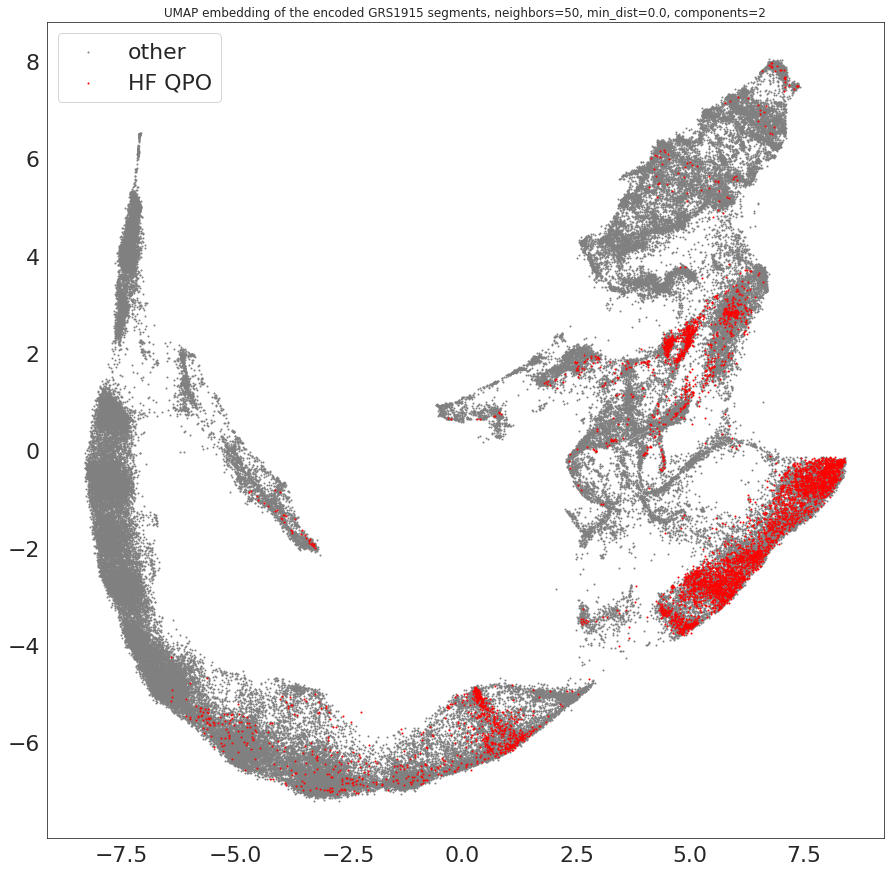

In [50]:
redint = np.where(np.array(qpo_colours) == "red")
greyint= np.where(np.array(qpo_colours) != "red")
ax.scatter(embeddings_lap[:,0][greyint], embeddings_lap[:,1][greyint], s=1, c="grey", label= "other")
ax.scatter(embeddings_lap[:,0][redint], embeddings_lap[:,1][redint], s=1, c="red", label= "HF QPO")
plt.title("UMAP embedding of the encoded GRS1915 segments, neighbors=50, min_dist=0.0, components=2", fontsize=12)
plt.legend()
# plt.savefig("Belloni_Altamirano_2013_embedded.png")
cid = fig.canvas.mpl_connect('button_press_event', onclick)
plt.show(1)

In [51]:
fig.canvas.mpl_disconnect(cid)

In [57]:
from mpldatacursor import datacursor
%matplotlib nbagg
redint = np.where(np.array(qpo_colours) == "red")
greyint= np.where(np.array(qpo_colours) != "red")
plt.scatter(embeddings_lap[:,0][greyint], embeddings_lap[:,1][greyint], s=1, c="grey", label= "other")
plt.scatter(embeddings_lap[:,0][redint], embeddings_lap[:,1][redint], s=1, c="red", label= "HF QPO")
plt.title("UMAP embedding of the encoded GRS1915 segments, neighbors=50, min_dist=0.0, components=2", fontsize=12)
plt.legend()
# plt.savefig("Belloni_Altamirano_2013_embedded.png")
datacursor(formatter='{label}'.format)
plt.show()

<IPython.core.display.Javascript object>

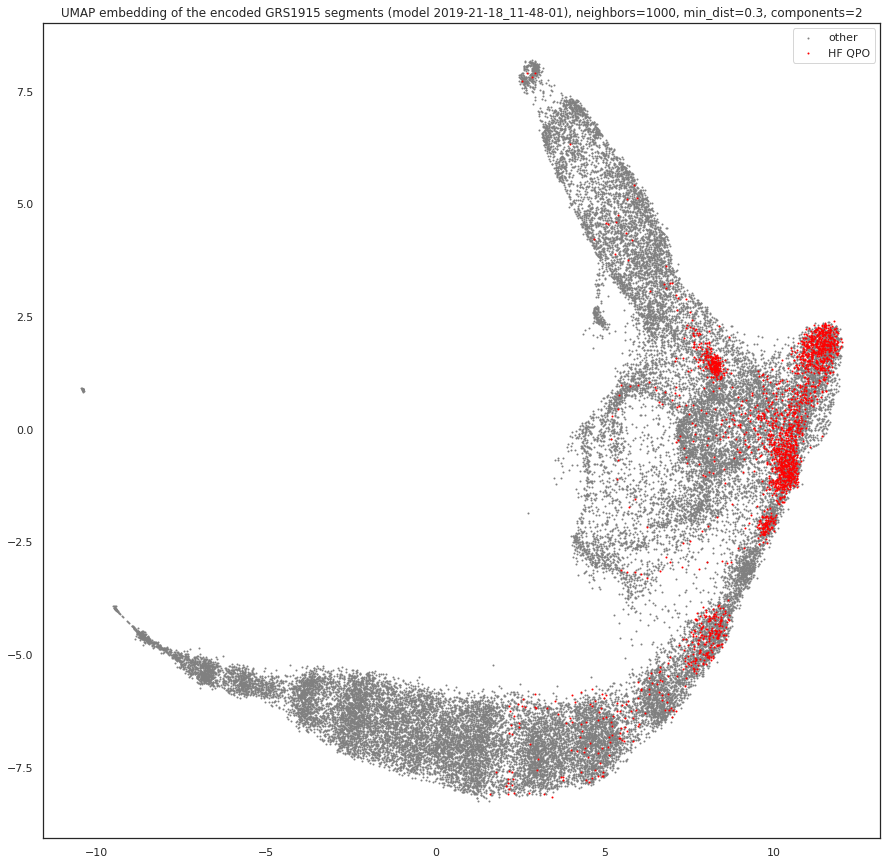

In [238]:
redint = np.where(np.array(qpo_colours) == "red")
greyint= np.where(np.array(qpo_colours) != "red")
plt.scatter(embedding[:,0][greyint], embedding[:,1][greyint], s=1, c="grey", label= "other")
plt.scatter(embedding[:,0][redint], embedding[:,1][redint], s=1, c="red", label= "HF QPO")
plt.title("UMAP embedding of the encoded GRS1915 segments (model 2019-21-18_11-48-01), neighbors=1000, min_dist=0.3, components=2", fontsize=12)
plt.legend()
plt.savefig("Belloni_Altamirano_2013_embedded.png")
plt.show()

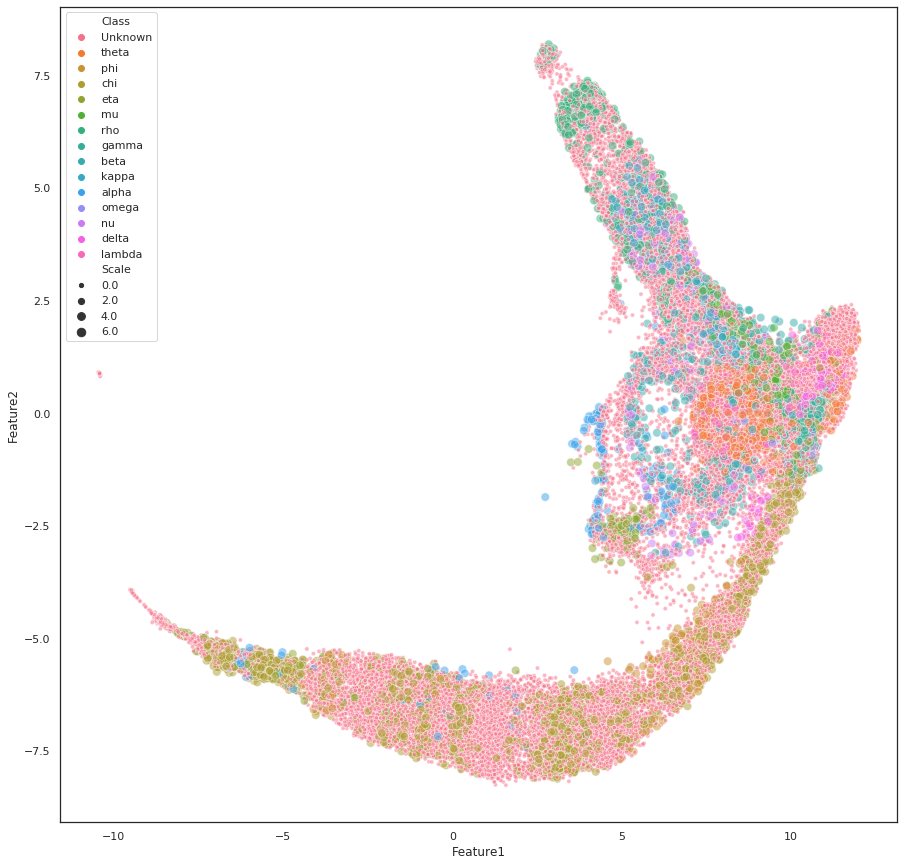

In [180]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
sns.set_style("white")
plt.rcParams['figure.figsize'] = (15.0, 15.0)
plt.rcParams.update({'font.size': 22})

# fig, ax = plt.subplots()



# scatter = ax.scatter(embedding[:,0], embedding[:,1], s=scales, c=class_colour, cmap=plt.get_cmap("Set1"), label= class_name)
# #ax.title("UMAP embedding of the encoded GRS1915 segments (model 2019-21-18_11-48-01), neighbors=1000, min_dist=0.3, components=2", fontsize=12)
# legend1 = ax.legend(*scatter.legend_elements(),
#                     loc="upper left", title="Classes")
# # plt.savefig("Belloni_Altamirano_2013_embedded.png")
# plt.show()

data = pd.DataFrame({"Feature1":embedding[:,0],"Feature2":embedding[:,1],"Class":class_name, "Scale": scales})
ax = sns.scatterplot(x="Feature1", y="Feature2", hue="Class", data=data, size="Scale", legend="brief", alpha=0.5)

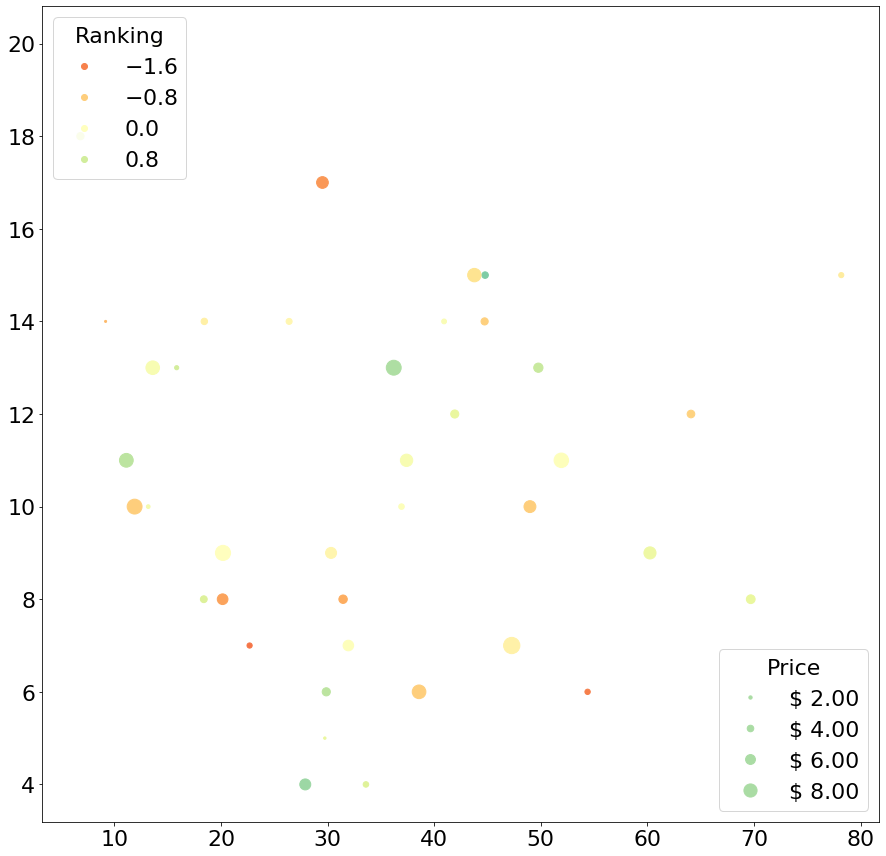

In [121]:
volume = np.random.rayleigh(27, size=40)
amount = np.random.poisson(10, size=40)
ranking = np.random.normal(size=40)
price = np.random.uniform(1, 10, size=40)

fig, ax = plt.subplots()

# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
scatter = ax.scatter(volume, amount, c=ranking, s=0.3*(price*3)**2,
                     vmin=-3, vmax=3, cmap="Spectral")

# Produce a legend for the ranking (colors). Even though there are 40 different
# rankings, we only want to show 5 of them in the legend.
legend1 = ax.legend(*scatter.legend_elements(num=5),
                    loc="upper left", title="Ranking")
ax.add_artist(legend1)

# Produce a legend for the price (sizes). Because we want to show the prices
# in dollars, we use the *func* argument to supply the inverse of the function
# used to calculate the sizes from above. The *fmt* ensures to show the price
# in dollars. Note how we target at 5 elements here, but obtain only 4 in the
# created legend due to the automatic round prices that are chosen for us.
kw = dict(prop="sizes", num=5, color=scatter.cmap(0.7), fmt="$ {x:.2f}",
          func=lambda s: np.sqrt(s/.3)/3)
legend2 = ax.legend(*scatter.legend_elements(**kw),
                    loc="lower right", title="Price")

plt.show()

In [103]:
class_name

['Unknown',
 'Unknown',
 'Unknown',
 'theta',
 'phi',
 'chi1',
 'Unknown',
 'Unknown',
 'eta',
 'Unknown',
 'chi2',
 'chi4',
 'Unknown',
 'Unknown',
 'chi1',
 'chi1',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'mu',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'chi3',
 'rho',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'chi2',
 'Unknown',
 'phi',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'gamma',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'beta',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'mu',
 'gamma',
 'rho',
 'kappa',
 'Unknown',
 'Unknown',
 'chi1',
 'Unknown',
 'Unknown',
 'Unknown',
 'chi1',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'gamma',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 '

In [28]:
embedding[[43, 457,  2019,  3654,  4998,  5980,  6140, 10157, 11274,
        11575, 12409, 12509, 14505, 14517, 14732, 14985, 15435, 15654,
        16962, 17461, 18327, 20288, 22816, 23428, 24234, 24984, 25277,
        27659, 28005, 30302, 31404, 33927, 34283]]

array([[-11.526635 ,   1.8713175],
       [-11.519357 ,   1.8644352],
       [-11.514196 ,   1.8457409],
       [-11.523595 ,   1.8698835],
       [-11.523269 ,   1.8698343],
       [-11.516806 ,   1.8600688],
       [-11.527672 ,   1.873804 ],
       [-11.516546 ,   1.8795195],
       [-11.556038 ,   1.9020844],
       [-11.523613 ,   1.8659941],
       [-11.520459 ,   1.866003 ],
       [-11.526368 ,   1.872886 ],
       [-11.525614 ,   1.8724091],
       [-11.513006 ,   1.8592855],
       [-11.527132 ,   1.8736084],
       [-11.518953 ,   1.8611484],
       [-11.52409  ,   1.8701606],
       [-11.524    ,   1.8708031],
       [-11.528364 ,   1.8742275],
       [-11.506189 ,   1.8475363],
       [-11.520778 ,   1.8676269],
       [-11.517159 ,   1.8528413],
       [-11.50646  ,   1.8240663],
       [-11.524603 ,   1.8715304],
       [-11.519468 ,   1.8639137],
       [-11.520718 ,   1.8666096],
       [-11.5258875,   1.8711436],
       [-11.528583 ,   1.8750304],
       [-11.527761 ,

In [67]:
bottom_bit = np.where(embedding[:,1] < -7.5)

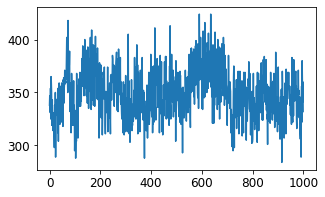

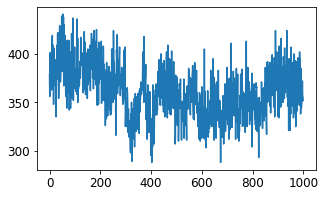

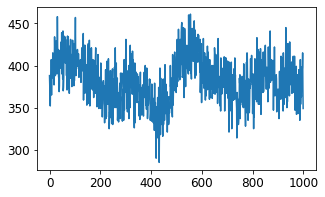

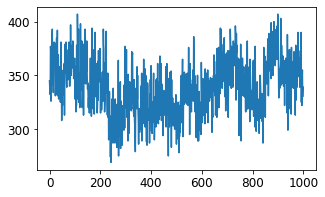

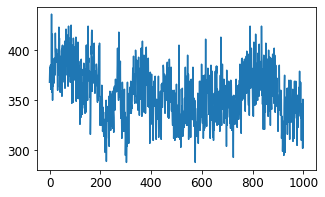

...

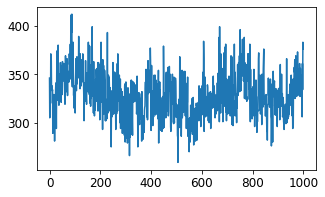

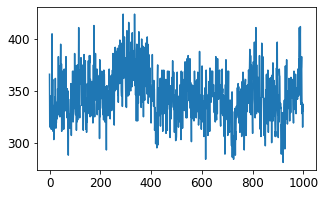

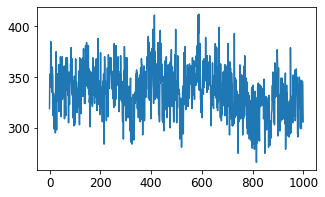

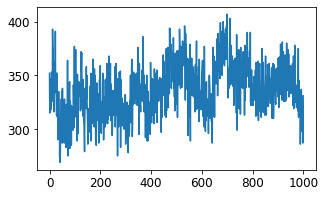

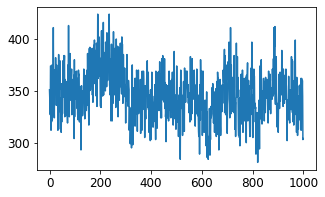

In [73]:
plt.rcParams['figure.figsize'] = (5.0, 3.0)
plt.rcParams.update({'font.size': 12})
for lc in enumerate(segments[left_cluster[:30]]):
    plt.plot((lc[1]).flatten())
    plt.show()

In [27]:
[x.split("_")[0] for x in np.asarray(seg_ids)[[43, 457,  2019,  3654,  4998,  5980,  6140, 10157, 11274,
        11575, 12409, 12509, 14505, 14517, 14732, 14985, 15435, 15654,
        16962, 17461, 18327, 20288, 22816, 23428, 24234, 24984, 25277,
        27659, 28005, 30302, 31404, 33927, 34283]]]

['93701-01-20-00',
 '93701-01-20-00',
 '93701-01-38-00',
 '93701-01-26-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-01',
 '93701-01-26-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-26-00',
 '93701-01-26-00',
 '93701-01-26-00',
 '93701-01-20-00',
 '93701-01-38-00',
 '80701-01-36-00',
 '93701-01-20-00',
 '93701-01-20-01',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-20-00',
 '93701-01-26-00',
 '93701-01-20-00']

In [35]:
ids=[x.split("_")[0] for x in seg_ids]
np.where((np.asarray(ids) == "93701-01-38-00"))

(array([ 2019, 20288]),)

In [44]:
len(top_cluster)

536

In [61]:
len(left_cluster[0])

33

In [63]:
np.asarray(ids)[left_cluster]

array(['93701-01-20-00', '93701-01-20-00', '93701-01-38-00',
       '93701-01-26-00', '93701-01-20-00', '93701-01-20-00',
       '93701-01-20-00', '93701-01-20-00', '93701-01-20-00',
       '93701-01-20-00', '93701-01-20-00', '93701-01-20-00',
       '93701-01-20-00', '93701-01-20-01', '93701-01-26-00',
       '93701-01-20-00', '93701-01-20-00', '93701-01-26-00',
       '93701-01-26-00', '93701-01-26-00', '93701-01-20-00',
       '93701-01-38-00', '80701-01-36-00', '93701-01-20-00',
       '93701-01-20-01', '93701-01-20-00', '93701-01-20-00',
       '93701-01-20-00', '93701-01-20-00', '93701-01-20-00',
       '93701-01-20-00', '93701-01-26-00', '93701-01-20-00'], dtype='<U15')

In [51]:
n=7

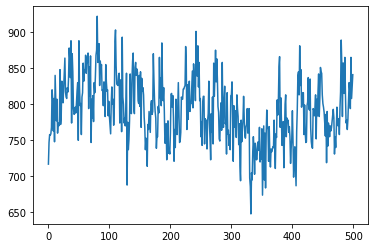

In [63]:
plt.plot(segments[n])
n+=1

In [16]:
for seg in seg_ids:
    print(ob_state[seg])

KeyError: '40116-01-03-01'

In [40]:
len(seg_ids)

1752

In [90]:
import umap

embedding = umap.UMAP(metric='correlation').fit_transform(encoded_segments)

/home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../anaconda3/envs/ae-env/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(parallel=True)
def build_candidates(current_graph, n_vertices, n_neighbors, max_candidates, rng_state):
^

  current_graph, n_vertices, n_neighbors, max_candidates, rng_state
/home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for hel

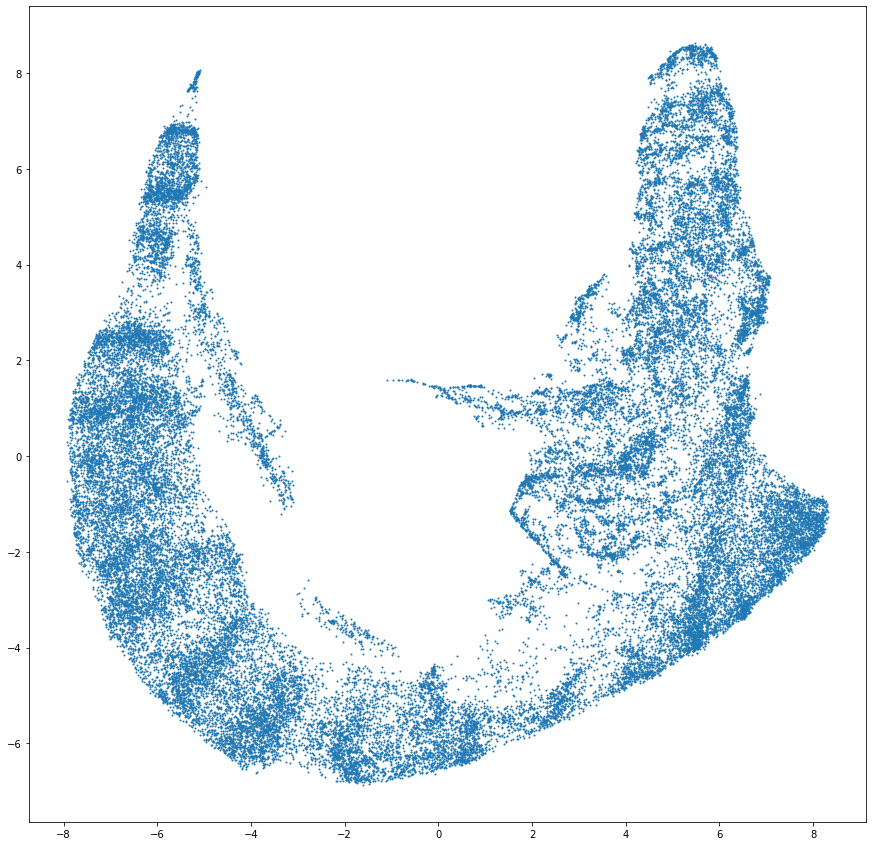

In [94]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (15.0, 15.0)
plt.scatter(embedding[:,0], embedding[:,1], s=1)

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
sns.set_style("white")
plt.rcParams['figure.figsize'] = (15.0, 15.0)
plt.rcParams.update({'font.size': 22})

# fig, ax = plt.subplots()
class_indices = np.where(np.array(class_name) == "Unknown")[0]
class_data = embedding[class_indices]

plt.scatter(class_data[:,0], class_data[:,1], s = 0.2, c="grey", label="Unknown")

for plot_class_ind, plot_class in enumerate(classes):
    class_indices = np.where(np.array(class_name) == plot_class)[0]
    class_data = embedding[class_indices]
    
    plt.scatter(class_data[:,0], class_data[:,1], s = 25, c=colours[plot_class_ind], label=plot_class)
    
plt.legend()
#plt.title("UMAP embedding of the encoded GRS1915 segments (model 2019-21-18_11-48-01), neighbors=1000, min_dist=0.3, components=2", fontsize=12)

# scatter = ax.scatter(embedding[:,0], embedding[:,1], s=scales, c=class_colour, label= class_name)
#ax.title("UMAP embedding of the encoded GRS1915 segments (model 2019-21-18_11-48-01), neighbors=1000, min_dist=0.3, components=2", fontsize=12)
# handles, labels = scatter.legend_elements(prop="colors", alpha=0.6)
# legend2 = ax.legend(handles, labels, loc="upper right", title="Classes")
# legend1 = ax.legend(*scatter.legend_elements(),
#                     loc="upper left", title="Classes")
#plt.savefig("umap_on_features_2019-12-18_11-48-01.png")
plt.show()

NameError: name 'class_name' is not defined

In [101]:
sec_count=0
for i in lcs:
    sec_count += len(i[0])

In [102]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import CuDNNGRU
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
# from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Flatten
from tensorflow.keras.backend import mean
from tensorflow.keras.backend import square
from tensorflow.keras.utils import Sequence

import numpy as np
import pickle
from scipy.stats import zscore
import datetime
import pytz

np.random.seed(seed=11)

with open('48610_len1024_s64_counts.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('48610_len1024_s64_errors.pkl', 'rb') as f:
    errors = pickle.load(f)
    
segments = zscore(segments).astype(np.float32)  # standardize
errors = zscore(errors).astype(np.float32)

def chi2(y_err):
    def MSE_scaled(y_in, y_out,):
        return mean(square(y_in-y_out)/square(y_err))
    return MSE_scaled


class DataGenerator(Sequence):
    """
    Generates data for Keras
    https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly
    https://stackoverflow.com/questions/53105294/implementing-a-batch-dependent-loss-in-keras
    """
    def __init__(self, y_in, y_err, batch_size=32, shuffle=True):
        'Initialization'
        self.batch_size = batch_size
        self.y_in = y_in
        self.y_err = y_err        
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.y) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        # Find list of IDs
        y_in = self.y_in[indexes]
        y_err = self.prec[indexes]
        return [y_in, y_err], y_in
    
    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)


# Training and Validation generators in a 95/5 split
training_generator = DataGenerator(segments[:np.floor(len(segments)*0.95)], errors[:np.floor(len(errors)*0.95)], batch_size=384)
validation_generator = DataGenerator(segments[np.floor(len(segments)*0.95):], errors[np.floor(len(errors)*0.95):], batch_size=384)
    
    
y_input = Input(shape=(input_dim,))
y_prec_input = Input(shape=(1,))


deep_model = Sequential(name="GRU-shallow-20")
deep_model.add(CuDNNGRU(50, input_shape=(1024,1), return_sequences=False))

deep_model.add(Dense(100, activation=None))
deep_model.add(Dense(20, activation=None))
deep_model.add(Dense(100, activation=None))

deep_model.add(RepeatVector(1024))
deep_model.add(CuDNNGRU(50, return_sequences=True))
deep_model.add(TimeDistributed(Dense(1)))
deep_model.compile(optimizer=Adam(clipnorm=1.0), loss=MSE_scaled(y_err))

#deep_model.load_weights("model_weights/lstm_autoencoder_2020-01-09_18-20-21.h5")

training_time_stamp = datetime.datetime.now(tz=pytz.timezone('Europe/London')).strftime("%Y-%m-%d_%H-%M-%S")

CB = EarlyStopping(monitor='val_loss', min_delta=1e-4, patience=100, verbose=1, mode='auto')
MC = ModelCheckpoint('model_weights/model_{}.h5'.format(training_time_stamp), monitor='val_loss', mode="auto", save_best_only=True, verbose=1)
history = deep_model.fit_generator(training_generator, epochs=8000, verbose=2, callbacks = [MC, CB], validation_data=validation_generator)


np.savetxt("training_history/loss_history-{}.txt".format(training_time_stamp), [np.asarray(history.history["loss"]), np.asarray(history.history["val_loss"])], delimiter=",")

5099757

In [161]:
from tensorflow.keras import Input


In [163]:
y_in = Input(shape=(1024,1))
y_err = Input(shape=(1024,1))

h_enc = CuDNNGRU(64, return_sequences=False)(y_in)
h_enc = Dense(32, activation=None name='bottleneck')(h_enc)
h_dec = RepeatVector(1024)(h_enc)
h_dec = CuDNNGRU(64, return_sequences=True)(h_dec)
h_dec = TimeDistributed(Dense(1))(h_dec)
model = Model(inputs=[y_input, y_prec_input], outputs=h_dec)
model.compile(optimizer='adam', loss=MAEpw_wrapper(y_prec_input))


NameError: name 'dims' is not defined

In [189]:
with open('for_snuffy/48610_len1024_s64_counts.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('for_snuffy/48610_len1024_s64_errors.pkl', 'rb') as f:
    errors = pickle.load(f)

In [174]:
segments

array([[[1957.],
        [2131.],
        [1953.],
        ...,
        [2220.],
        [2112.],
        [2021.]],

       [[1257.],
        [1327.],
        [1621.],
        ...,
        [1356.],
        [1329.],
        [1457.]],

       [[1398.],
        [1226.],
        [1369.],
        ...,
        [ 968.],
        [1017.],
        [1277.]],

       ...,

       [[1928.],
        [1961.],
        [1694.],
        ...,
        [1411.],
        [1524.],
        [1612.]],

       [[1570.],
        [1559.],
        [1420.],
        ...,
        [1206.],
        [1660.],
        [1247.]],

       [[9005.],
        [8994.],
        [9404.],
        ...,
        [1109.],
        [1073.],
        [ 994.]]])

In [190]:
((errors-np.mean(segments))/np.std(segments)).shape

(48610, 1024, 1)

In [215]:
np.mean((zscore(segments, axis=None)-(zscore(segments, axis=None)+0.9))**2/((errors-np.mean(segments))/np.std(segments))**2)

0.3041680897523309

In [219]:
np.mean((zscore(segments, axis=None)-(zscore(segments, axis=None)+0.9))**2)

0.8100000000000277

In [224]:
np.arange(0.1,1.1,0.1)

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

Text(0.5, 0, 'mean error')

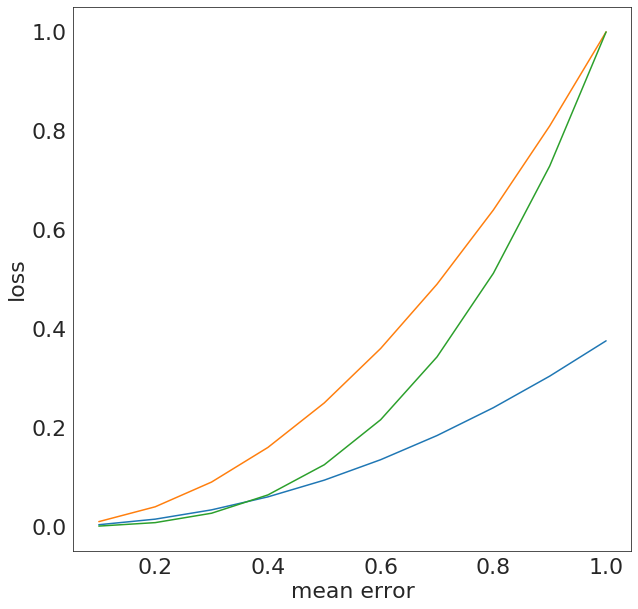

In [247]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)

plt.plot(np.arange(0.1,1.1,0.1), [0.003755161601880628, 0.015020646407522513, 0.033796454416925664, 0.06008258563009005, 0.09387904004701526,0.13518581766770266,0.18400291849215009,0.2403303425203602,0.3041680897523309, 0.37551616018806105])
plt.plot(np.arange(0.1,1.1,0.1), [0.00999999999999942, 0.03999999999999768, 0.08999999999999173, 0.15999999999999073, 0.25,0.3599999999999669,0.4899999999999376,0.6399999999999629,0.8100000000000277, 1.0])
plt.plot(np.arange(0.1,1.1,0.1), (np.arange(0.1,1.1,0.1))**3)
plt.ylabel("loss")
plt.xlabel("mean error")

In [258]:
new_loss = 0.05573

mean_error=(new_loss)**(1/3)
print("old loss", mean_error**2)

old loss 0.14590136735975068


In [263]:
np.mean((errors)/np.std(segments))

0.09448682650553018

In [266]:
0.09448682650553018**3

0.0008435557463996078

In [274]:
from tensorflow.keras import Model
from tensorflow.keras.backend import mean
from tensorflow.keras.backend import square
y_in = Input(shape=(1024,1))
y_err = Input(shape=(1024,1))

def chi2(y_err):
    def MSE_scaled(y_in, y_out,):
        return mean(square(y_in-y_out)/square(y_err))
    return MSE_scaled

h_enc = CuDNNGRU(64, return_sequences=False)(y_in)
h_enc = Dense(32, activation=None, name='bottleneck')(h_enc)
h_dec = RepeatVector(1024)(h_enc)
h_dec = CuDNNGRU(64, return_sequences=True)(h_dec)
h_dec = TimeDistributed(Dense(1))(h_dec)
model = Model(inputs=[y_in, y_err], outputs=h_dec)
model.compile(optimizer='adam', loss=chi2(y_err))

model.load_weights("model_2020-01-24_16-58-05.h5")

InvalidArgumentError: No OpKernel was registered to support Op 'CudnnRNNV2' used by node cu_dnngru/CudnnRNNV2 (defined at /home/jakub/anaconda3/envs/ae-env/lib/python3.7/site-packages/tensorflow_core/python/framework/ops.py:1748) with these attrs: [seed2=0, is_training=true, seed=0, dropout=0, T=DT_FLOAT, input_mode="linear_input", direction="unidirectional", rnn_mode="gru"]
Registered devices: [CPU, XLA_CPU]
Registered kernels:
  device='GPU'; T in [DT_DOUBLE]
  device='GPU'; T in [DT_FLOAT]
  device='GPU'; T in [DT_HALF]

	 [[cu_dnngru/CudnnRNNV2]]

In [5]:
from ftplib import ftp
filenames = ftp.nlst() # get filenames within the directory
print(filenames)

for filename in filenames:
    local_filename = os.path.join('ftp://ftp.astrouw.edu.pl/ogle/ogle3/xrom/', filename)
    file = open(local_filename, 'wb')
    ftp.retrbinary('RETR '+ filename, file.write)

    file.close()

ftp.quit() # This is the “polite” way to close a connection

NameError: name 'event' is not defined

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# from mpldatacursor import datacursor
# %matplotlib nbagg
embeddings_lap  = np.loadtxt("embedding_50n_0dist.csv", delimiter=",")
plt.rcParams['figure.figsize'] = (15.0, 15.0)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(embeddings_lap[:,0], embeddings_lap[:,1], s=0.1)
coords=[]

def onclick(event):
    global ix, iy
    ix, iy = event.xdata, event.ydata
    print(ix, iy)

    global coords
    coords.append((ix, iy))

    if len(coords) == 10:
        fig.canvas.mpl_disconnect(cid)
        coords=np.array(coords)
        np.savetxt("click_coords.csv", coords, delimiter=",")
        
    return coords
cid = fig.canvas.mpl_connect('button_press_event', onclick)


plt.show()

In [1]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.backend import mean
from tensorflow.keras.backend import square


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import CuDNNLSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Flatten

from tensorflow.keras.utils import Sequence
from tensorflow.keras import Input
from tensorflow.keras import Model
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv1D
import numpy as np
import pickle
from scipy.stats import zscore
import datetime
import pytz



np.random.seed(seed=11)

with open('../../../data_GRS1915/191660_len256_stride4_4sec_counts.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../../data_GRS1915/191660_len256_stride4_4sec_errors.pkl', 'rb') as f:
    errors = pickle.load(f)
    
errors = ((errors)/np.std(segments)).astype(np.float32)
segments = zscore(segments, axis=None).astype(np.float32)  # standardize

def chi2(y_err):
    def MSE_scaled(y_in, y_out,):
        return mean(square(y_in-y_out)/square(y_err))
    return MSE_scaled


class DataGenerator(Sequence):
    """
    Generates data for Keras
    https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly
    https://stackoverflow.com/questions/53105294/implementing-a-batch-dependent-loss-in-keras
    """
    def __init__(self, y_in, y_err, batch_size=32, shuffle=True):
        'Initialization'
        self.batch_size = batch_size
        self.y_in = y_in
        self.y_err = y_err        
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.y_in) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        # Find list of IDs
        y_in = self.y_in[indexes]
        y_err = self.y_err[indexes]
        return [y_in, y_err], y_in
    
    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.y_in))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


original_dim = 256
intermediate_dim = 1024
latent_dim = 16

# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,1), name='encoder_input')
input_err = Input(shape=(256,1))
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=False)(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.RepeatVector(original_dim)(latent_inputs)
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=True)(x)
outputs = layers.TimeDistributed(layers.Dense(1))(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=[original_inputs, input_err], outputs=outputs, name='vae')

# Add KL divergence regularization loss.
kl_loss = - 0.5 * tf.reduce_mean(
    z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
vae.add_loss(kl_loss)

optimizer = tf.keras.optimizers.Adam(clipvalue=0.5)

vae.compile(optimizer, loss=chi2(input_err))

    
# Training and Validation generators in a 95/5 split
training_generator = DataGenerator(segments[:int(np.floor(len(segments)*0.95))], errors[:int(np.floor(len(errors)*0.95))], batch_size=512)
validation_generator = DataGenerator(segments[int(np.floor(len(segments)*0.95)):], errors[int(np.floor(len(errors)*0.95)):], batch_size=512)    


training_time_stamp = datetime.datetime.now(tz=pytz.timezone('Europe/London')).strftime("%Y-%m-%d_%H-%M-%S")

CB = EarlyStopping(monitor='val_loss', min_delta=5e-5, patience=100, verbose=1, mode='auto')
MC = ModelCheckpoint('../../../model_weights/model_{}.h5'.format(training_time_stamp), monitor='val_loss', mode="auto", save_best_only=True, verbose=1)
history = vae.fit_generator(training_generator, epochs=8000, verbose=2, callbacks = [MC, CB], validation_data=validation_generator)


np.savetxt("training_history/loss_history-{}.txt".format(training_time_stamp), [np.asarray(history.history["loss"]), np.asarray(history.history["val_loss"])], delimiter=",")


Epoch 1/8000

Epoch 00001: val_loss improved from inf to 38.91918, saving model to ../../../model_weights/model_2020-03-15_14-42-06.h5
 - 304s - loss: 41.2973 - val_loss: 38.9192
Epoch 2/8000


KeyboardInterrupt: 

In [116]:
# with open('../../../data_GRS1915/94465_len512_s40_counts.pkl', 'rb') as f:
#     segments = pickle.load(f)
# with open('../../../data_GRS1915/94465_len512_s40_errors.pkl', 'rb') as f:
#     errors = pickle.load(f)
with open('../../../data_GRS1915/94465_len512_s40_ids.pkl', 'rb') as f:
    seg_ids = pickle.load(f)
    
embeddings = np.loadtxt("../../../model_2020-02-09_10-36-06_embeddings_94465.csv", delimiter=",")
    
    
# errors = ((errors)/np.std(segments)).astype(np.float32)
# segments = zscore(segments, axis=None).astype(np.float32)  # standardize

In [ ]:
split_ids = [seg.split("_")[0] for seg in seg_ids]
unique_ids = np.unique(split_ids)
classes = []
for ob_id in unique_ids:
    classes.append(ob_state[ob_id])

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit
X = np.array([[1, 2], [3, 4], [1, 2], [3, 4], [1, 2], [3, 4]])
y = np.array([0, 0, 0, 1, 1, 1])
sss = StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state=0)
sss.get_n_splits(X, y)

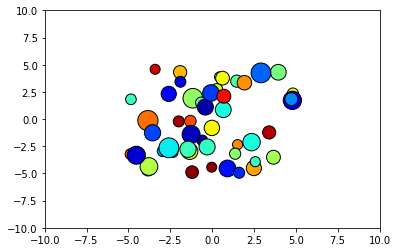

In [3]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

class AnimatedScatter(object):
    """An animated scatter plot using matplotlib.animations.FuncAnimation."""
    def __init__(self, numpoints=50):
        self.numpoints = numpoints
        self.stream = self.data_stream()

        # Setup the figure and axes...
        self.fig, self.ax = plt.subplots()
        # Then setup FuncAnimation.
        self.ani = animation.FuncAnimation(self.fig, self.update, interval=5, 
                                          init_func=self.setup_plot, blit=True)

    def setup_plot(self):
        """Initial drawing of the scatter plot."""
        x, y, s, c = next(self.stream).T
        self.scat = self.ax.scatter(x, y, c=c, s=s, vmin=0, vmax=1,
                                    cmap="jet", edgecolor="k")
        self.ax.axis([-10, 10, -10, 10])
        # For FuncAnimation's sake, we need to return the artist we'll be using
        # Note that it expects a sequence of artists, thus the trailing comma.
        return self.scat,

    def data_stream(self):
        """Generate a random walk (brownian motion). Data is scaled to produce
        a soft "flickering" effect."""
        xy = (np.random.random((self.numpoints, 2))-0.5)*10
        s, c = np.random.random((self.numpoints, 2)).T
        while True:
            xy += 0.03 * (np.random.random((self.numpoints, 2)) - 0.5)
            s += 0.05 * (np.random.random(self.numpoints) - 0.5)
            c += 0.02 * (np.random.random(self.numpoints) - 0.5)
            yield np.c_[xy[:,0], xy[:,1], s, c]

    def update(self, i):
        """Update the scatter plot."""
        data = next(self.stream)

        # Set x and y data...
        self.scat.set_offsets(data[:, :2])
        # Set sizes...
        self.scat.set_sizes(300 * abs(data[:, 2])**1.5 + 100)
        # Set colors..
        self.scat.set_array(data[:, 3])

        # We need to return the updated artist for FuncAnimation to draw..
        # Note that it expects a sequence of artists, thus the trailing comma.
        return self.scat,

if __name__ == '__main__':
    a = AnimatedScatter()
    a.ani.save('test.gif',writer='imagemagick') 
    plt.show()

In [2]:
import pickle
with open('../../../data_GRS1915/94465_len512_s40_counts.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../../data_GRS1915/94465_len512_s40_errors.pkl', 'rb') as f:
    errors = pickle.load(f)
with open('../../../data_GRS1915/94465_len512_s40_ids.pkl', 'rb') as f:
    seg_ids = pickle.load(f)


In [5]:
segs = segments.squeeze()

In [19]:
zscore(segs, axis=1)[0][-1]

1.4396439599278648

In [17]:
((segs[0] - np.mean(segs[0]))/np.std(segs[0]))[-1]

1.4396439599278648

In [10]:
zscore(segs[0])

array([-4.34503433e-01, -5.01437269e-01, -4.90281629e-01, -1.66768091e-01,
       -6.35304940e-01,  1.03804095e+00,  1.90212364e-01, -4.12192155e-01,
       -8.47262085e-01, -1.77923731e-01, -7.02238775e-01,  1.83009133e+00,
        1.23278529e-01, -1.02575231e+00, -1.67277939e+00, -9.92285396e-01,
       -6.01838022e-01,  1.66275674e+00,  4.51890543e-02, -4.90281629e-01,
        1.80778006e+00, -6.63673382e-02, -1.79549142e+00, -4.34503433e-01,
       -8.69573364e-01,  6.47593574e-01,  1.07150786e+00, -1.01459667e+00,
        4.57947706e-01, -1.63931247e+00,  1.33924321e+00, -6.57616218e-01,
        3.01768757e-01,  1.41733268e+00,  1.46195524e+00,  9.93418390e-01,
        3.02374473e+00,  1.35039885e+00,  6.25282295e-01, -6.57616218e-01,
       -5.46059826e-01, -1.44456813e-01,  1.58466727e+00,  1.12728606e+00,
       -4.90281629e-01,  1.56235599e+00, -3.45258319e-01,  3.12924396e-01,
        5.69504099e-01, -4.01036516e-01, -5.68371104e-01,  1.13844170e+00,
        6.69904852e-01,  

In [8]:
import numpy as np
from scipy.stats import zscore


(segs[0] - np.mean(segs[0]))/np.std(segs[0])

array([-4.34503433e-01, -5.01437269e-01, -4.90281629e-01, -1.66768091e-01,
       -6.35304940e-01,  1.03804095e+00,  1.90212364e-01, -4.12192155e-01,
       -8.47262085e-01, -1.77923731e-01, -7.02238775e-01,  1.83009133e+00,
        1.23278529e-01, -1.02575231e+00, -1.67277939e+00, -9.92285396e-01,
       -6.01838022e-01,  1.66275674e+00,  4.51890543e-02, -4.90281629e-01,
        1.80778006e+00, -6.63673382e-02, -1.79549142e+00, -4.34503433e-01,
       -8.69573364e-01,  6.47593574e-01,  1.07150786e+00, -1.01459667e+00,
        4.57947706e-01, -1.63931247e+00,  1.33924321e+00, -6.57616218e-01,
        3.01768757e-01,  1.41733268e+00,  1.46195524e+00,  9.93418390e-01,
        3.02374473e+00,  1.35039885e+00,  6.25282295e-01, -6.57616218e-01,
       -5.46059826e-01, -1.44456813e-01,  1.58466727e+00,  1.12728606e+00,
       -4.90281629e-01,  1.56235599e+00, -3.45258319e-01,  3.12924396e-01,
        5.69504099e-01, -4.01036516e-01, -5.68371104e-01,  1.13844170e+00,
        6.69904852e-01,  

In [ ]:
errors = ((errors)/np.std(segments)).astype(np.float32)
segments = zscore(segments, axis=1).astype(np.float32)

In [21]:
errs = errors.squeeze()

In [32]:
(errs[0]/np.std(segs[0]))[-1]

1.0666021905996683

In [31]:
(errs/np.expand_dims(np.std(segs, axis=1), axis=1))[0][-1]

1.0666021905996683

In [51]:
with open('../../../data_GRS1915/94465_len512_s40_counts.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../../data_GRS1915/94465_len512_s40_errors.pkl', 'rb') as f:
    errors = pickle.load(f)
    
# errors = ((errors)/np.std(segments)).astype(np.float32)
# segments = zscore(segments, axis=None).astype(np.float32)  # standardize

# errors = np.expand_dims((np.squeeze(errors)/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)
# segments = np.expand_dims(((np.squeeze(segments)-np.min(segments, axis=1))/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)

errors_s = ((errors)/np.expand_dims(np.std(segments, axis=1), axis=1))#((errors)/np.expand_dims(np.std(segments), axis=1)).astype(np.float32)
segments_s = zscore(segments, axis=1).astype(np.float32)

In [45]:
np.std(segments[0])

89.64076177311664

In [54]:
np.expand_dims(np.std(segments, axis=1), axis=1)

array([[[ 89.64076177]],

       [[371.06210449]],

       [[712.77179692]],

       ...,

       [[623.90243579]],

       [[107.58972538]],

       [[201.79856267]]])

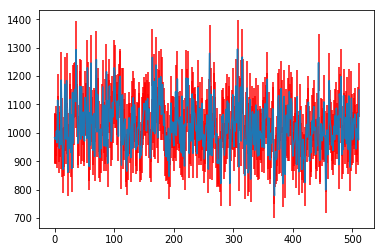

In [41]:
import matplotlib.pyplot as plt
plt.errorbar(x=list(range(512)), y=segments[0].squeeze(), yerr=errors[0].squeeze(), ecolor="r")
plt.show()

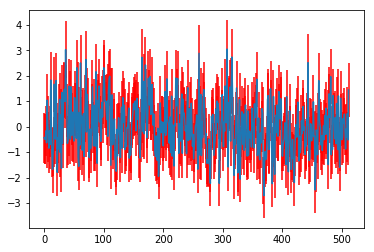

In [52]:
import matplotlib.pyplot as plt
plt.errorbar(x=list(range(512)), y=segments_s[0].squeeze(), yerr=errors_s[0].squeeze(), ecolor="r")
plt.show()

In [56]:
np.std(errors[0]/np.std(segments[0]))

0.04427953135831241

In [231]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.backend import mean
from tensorflow.keras.backend import square


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import CuDNNLSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Flatten

from tensorflow.keras.utils import Sequence
from tensorflow.keras import Input
from tensorflow.keras import Model
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv1D
import numpy as np
import pickle
from scipy.stats import zscore
import datetime
import pytz


with open('../../../data_GRS1915/94465_len512_s40_counts_errorfix.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../../data_GRS1915/94465_len512_s40_errors_errorfix.pkl', 'rb') as f:
    errors = pickle.load(f)

errors = np.expand_dims((np.squeeze(errors)/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)
segments = np.expand_dims(((np.squeeze(segments)-np.min(segments, axis=1))/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)

# errors = np.expand_dims((np.squeeze(errors)/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)
# segments = np.expand_dims(((np.squeeze(segments)-np.min(segments, axis=1))/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)
# errors = ((errors)/np.std(segments)).astype(np.float32)
# segments = zscore(segments, axis=None).astype(np.float32)  # standardize


# errors = ((errors)/np.expand_dims(np.std(segments, axis=1), axis=1)).astype(np.float32)
# segments = zscore(segments, axis=1).astype(np.float32)  # standardize per segment


class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.
    https://www.tensorflow.org/guide/keras/custom_layers_and_models#putting_it_all_together_an_end-to-end_example"""
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

original_dim = 512
intermediate_dim = 256
latent_dim = 16

# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,1), name='encoder_input')
input_err = Input(shape=(original_dim,1))
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=False)(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.RepeatVector(original_dim)(latent_inputs)
x = layers.CuDNNLSTM(intermediate_dim, return_sequences=True)(x)
outputs = layers.TimeDistributed(layers.Dense(1))(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=[original_inputs, input_err], outputs=outputs, name='vae')

# Add KL divergence regularization loss.
# kl_loss = - 0.5 * tf.reduce_mean(
#     z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
# vae.add_loss(kl_loss)

# optimizer = tf.keras.optimizers.Adam(clipvalue=0.5) #Adam(clipvalue=0.5)

# vae.compile(optimizer, loss=chi2(input_err))

vae.load_weights("../../../model_weights/model_2020-04-20_14-24-04.h5")



In [229]:
reconstructions.shape

NameError: name 'reconstructions' is not defined

In [232]:
reconstructions = np.zeros((94465, 512))
for segment_index, segment in enumerate(segments):
    reconstructions[segment_index] = vae.predict([np.expand_dims(segment, axis=0), np.expand_dims(errors[segment_index], axis=0)]).flatten()

KeyboardInterrupt: 

In [65]:
# model2= Model(inputs=model1.input, outputs=model1.get_layer(layer_name).output)
dist_encoder = tf.keras.Model(inputs=vae.input, outputs=[vae.get_layer("z_mean").output, vae.get_layer("z_log_var").output])
ooo = dist_encoder.predict([np.expand_dims(segments[1], axis=0), np.expand_dims(errors[0], axis=0)])
# ooo = vae.predict([segments[0], errors[0]])

In [66]:
from IPython.display import clear_output

vae_encoding = np.zeros((94465, 2, 16))
for seg_ind, seg in enumerate(segments):
    prediction = dist_encoder.predict([np.expand_dims(seg, axis=0), np.expand_dims(errors[seg_ind], axis=0)])
    vae_encoding[seg_ind][0] = prediction[0].flatten()
    vae_encoding[seg_ind][1] = prediction[1].flatten()
    print(seg_ind)
    clear_output(wait=True)
    

94464


In [67]:
# np.savetxt("../../../data_GRS1915/vae_encoding_model_2020-03-31_14-26-15.csv", vae_encoding, delimiter=",")
with open('../../../data_GRS1915/vae_encoding_model_2020-04-20_14-24-04.pkl', 'wb') as f:
    pickle.dump(vae_encoding, f)

In [ ]:
with open('../../../data_GRS1915/159927_len256_s4_4cad_counts_errorfix.pkl', 'wb') as f:
    pickle.dump(segments_counts, f)

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import CuDNNLSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import RepeatVector
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Flatten
from tensorflow.keras.backend import mean
from tensorflow.keras.backend import square
from tensorflow.keras.utils import Sequence
from tensorflow.keras import Input
from tensorflow.keras import Model
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv1D
import numpy as np
import pickle
from scipy.stats import zscore
import datetime
import pytz





with open('../../../data_GRS1915/histograms_model_2020-04-20_14-24-04.pkl', 'rb') as f:
    segments = pickle.load(f)
# with open('../../data_GRS1915/94465_len512_s40_errors_errorfix.pkl', 'rb') as f:
#     errors = pickle.load(f)
    
# errors = ((errors)/np.std(segments)).astype(np.float32)
segments = zscore(np.expand_dims(segments, axis=-1), axis=None).astype(np.float32)  # standardize


y_in = Input(shape=(64,1))
# y_err = Input(shape=(512,1))
# h_enc = Conv1D(32, 2, activation='relu')(y_in)
# h_enc = Conv1D(32, 8, activation='relu')(h_enc)
# h_enc = CuDNNGRU(512, return_sequences=True)(y_in)
# h_enc = CuDNNGRU(256, return_sequences=True)(y_in)
h_enc = CuDNNLSTM(256, return_sequences=False)(y_in)
# h_enc = Dense(256)(h_enc)
h_enc = Dense(8, activation=None, name='bottleneck')(h_enc)
# h_enc = BatchNormalization()(h_enc)
h_dec = RepeatVector(64)(h_enc)
h_dec = CuDNNLSTM(258, return_sequences=True)(h_dec)
# h_dec = CuDNNGRU(256, return_sequences=True)(h_dec)
h_dec = TimeDistributed(Dense(1))(h_dec)
model = Model(inputs=[y_in], outputs=h_dec)
# model.compile(optimizer=Adam(clipvalue=0.5), loss='mean_squared_error')

model.load_weights("../../../model_weights/model_2020-04-21_00-40-07.h5")





In [189]:
hist_reconstructions = np.zeros((94465, 64))
for segment_index, segment in enumerate(segments[:200]):
    hist_reconstructions[segment_index] = model.predict(np.expand_dims(segment, axis=0)).flatten()

In [195]:
np.linspace(0,13100, 64)

array([    0.        ,   207.93650794,   415.87301587,   623.80952381,
         831.74603175,  1039.68253968,  1247.61904762,  1455.55555556,
        1663.49206349,  1871.42857143,  2079.36507937,  2287.3015873 ,
        2495.23809524,  2703.17460317,  2911.11111111,  3119.04761905,
        3326.98412698,  3534.92063492,  3742.85714286,  3950.79365079,
        4158.73015873,  4366.66666667,  4574.6031746 ,  4782.53968254,
        4990.47619048,  5198.41269841,  5406.34920635,  5614.28571429,
        5822.22222222,  6030.15873016,  6238.0952381 ,  6446.03174603,
        6653.96825397,  6861.9047619 ,  7069.84126984,  7277.77777778,
        7485.71428571,  7693.65079365,  7901.58730159,  8109.52380952,
        8317.46031746,  8525.3968254 ,  8733.33333333,  8941.26984127,
        9149.20634921,  9357.14285714,  9565.07936508,  9773.01587302,
        9980.95238095, 10188.88888889, 10396.82539683, 10604.76190476,
       10812.6984127 , 11020.63492063, 11228.57142857, 11436.50793651,
      

/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/matplotlib/__init__.py:855: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/home/jkok1g14/anaconda3/envs/jakub-tf/lib/python3.5/site-packages/matplotlib/__init__.py:846: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 2.2 and will be removed in 3.1.
  "2.2", name=key, obj_type="rcparam", addendum=addendum)


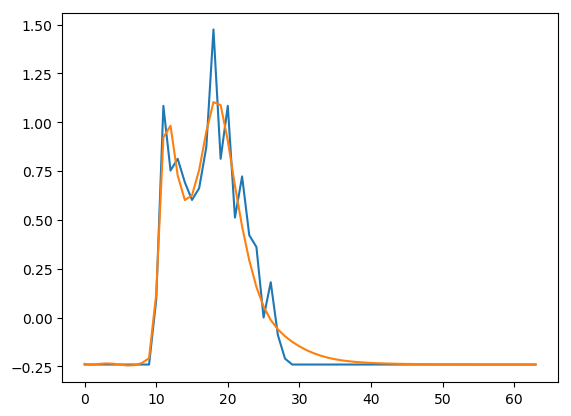

In [206]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.rcParams.update(plt.rcParamsDefault)

m+=1
plt.plot(segments[m])
plt.plot(hist_reconstructions[m])
plt.show()

In [22]:
from IPython.display import clear_output


encoder = Sequential(model.layers[:3])

hist_encoding = np.zeros((94465, 8))


for seg_index, segment in enumerate(segments):
    hist_encoding[seg_index] = encoder.predict(np.expand_dims(segment, axis=0))
    print(seg_index+1, "/", len(segments))
    clear_output(wait=True)

94465 / 94465


In [26]:
import matplotlib.pyplot as plt 
import umap
UMAP_mapper = umap.UMAP(n_neighbors=50, min_dist=0.0)
UMAP_mapper.fit(hist_encoding)



UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.0, n_components=2, n_epochs=None,
   n_neighbors=50, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=False)

In [27]:
hist_umaped = UMAP_mapper.transform(hist_encoding)

In [28]:
hist_umaped

(94465, 2)

In [29]:
# with open('../../../data_GRS1915/histogram_UMAPmapper_model_2020-04-21_00-40-07.pkl', 'wb') as f:
#     pickle.dump(UMAP_mapper, f)

In [25]:
# with open('../../../data_GRS1915/histogram_encoding_model_2020-04-21_00-40-07.pkl', 'wb') as f:
#     pickle.dump(hist_encoding, f)

In [30]:
with open('../../../data_GRS1915/vae_encoding_model_2020-04-20_14-24-04.pkl', 'rb') as f:
    segment_encodings = pickle.load(f)

segment_encodings.shape

(94465, 2, 16)

In [31]:
segment_latent_mean = segment_encodings[:,0,:]

In [32]:
UMAP_mapper = umap.UMAP(n_neighbors=50, min_dist=0.0)
UMAP_mapper.fit(segment_latent_mean)
means_umaped = UMAP_mapper.transform(segment_latent_mean)

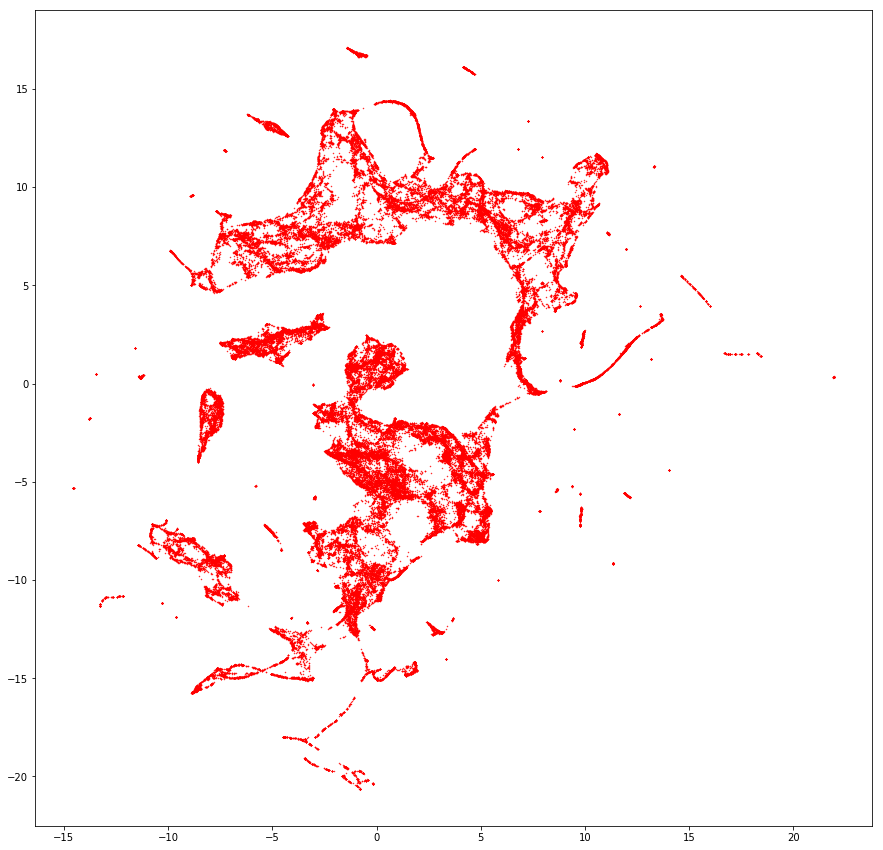

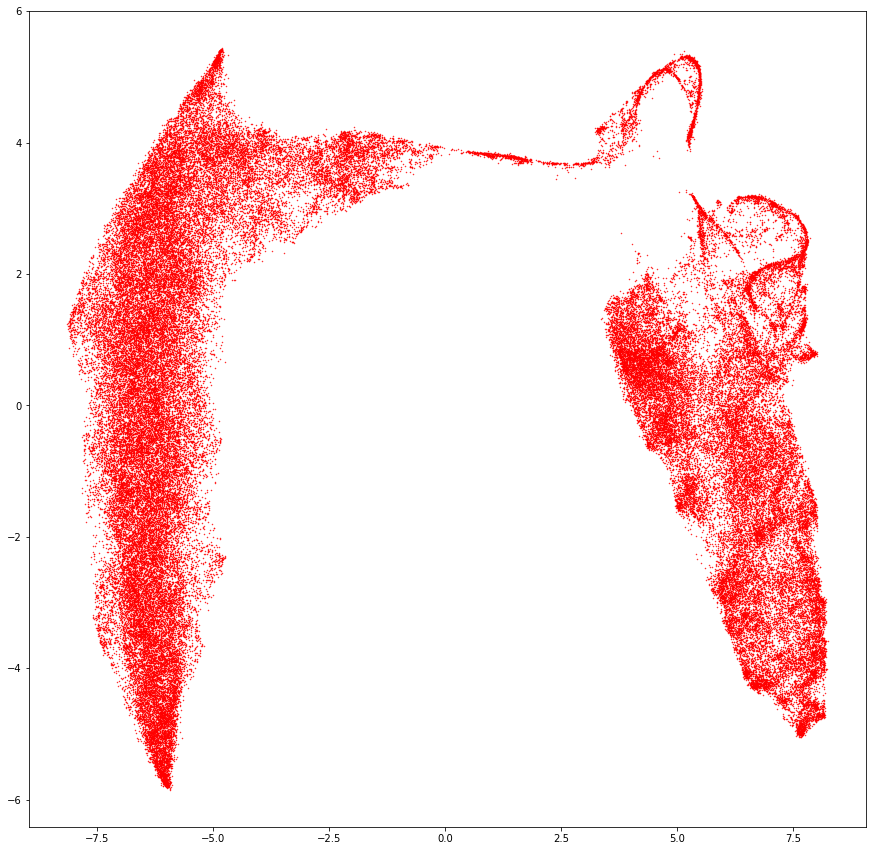

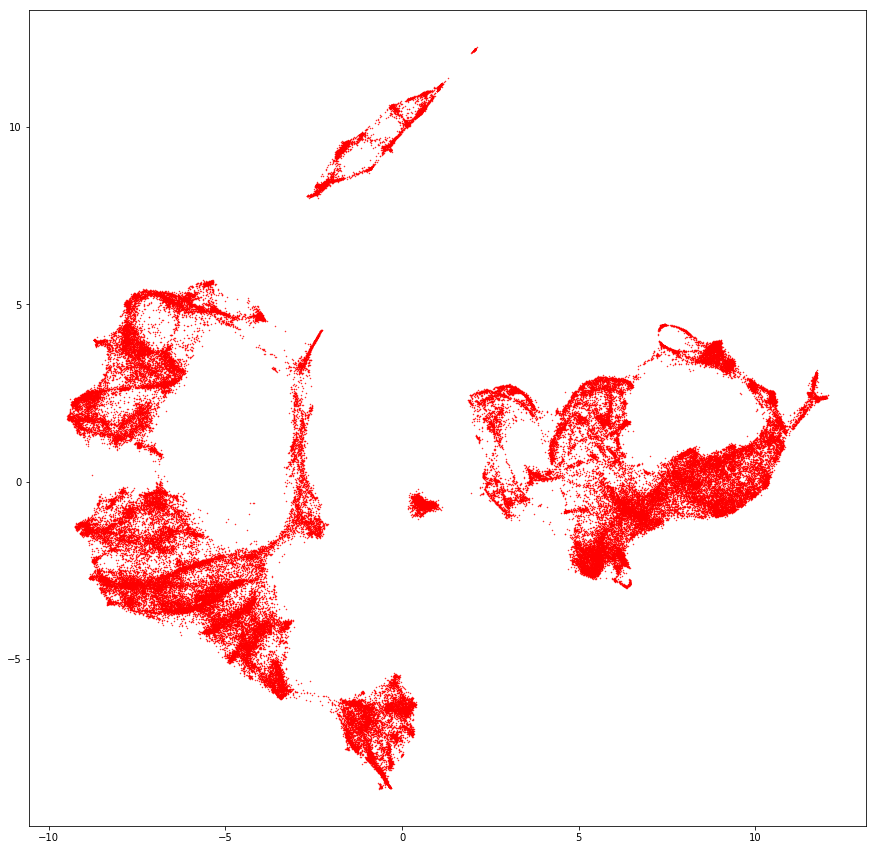

In [151]:
plt.rcParams['figure.figsize'] = (15.0, 15.0)

plt.scatter(hist_umaped[:,0], hist_umaped[:,1], c='red', s=0.2)
plt.show()
plt.scatter(means_umaped[:,0], means_umaped[:,1], c='red', s=0.2)
plt.show()
plt.scatter(all_umaped[:,0], all_umaped[:,1], c='red', s=0.2)
plt.show()

In [39]:
with open('../../../data_GRS1915/UMAPmapper_model_2020-04-20_14-24-04.pkl', 'wb') as f:
    pickle.dump(UMAP_mapper, f)

In [146]:
np.std(segment_latent_mean)

0.8305589232434918

In [147]:
all_features = np.hstack((zscore(segment_latent_mean, axis=None), zscore(hist_encoding, axis=None)))

In [149]:
UMAP_mapper = umap.UMAP(n_neighbors=50, min_dist=0.0)
UMAP_mapper.fit(all_features)
all_umaped = UMAP_mapper.transform(all_features)

In [150]:
with open('../../../data_GRS1915/UMAPmapper_model_2020-04-20_14-24-04_plus_hists.pkl', 'wb') as f:
    pickle.dump(UMAP_mapper, f)

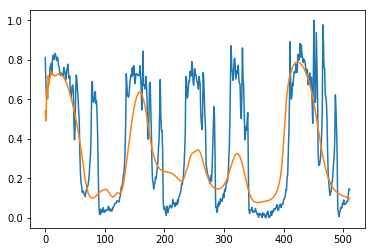

In [63]:
import matplotlib.pyplot as plt
n+=1
plt.plot(segments[n])
plt.plot(reconstructions[n])
plt.show()

In [1]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
with open('../../../data_GRS1915/94465_len512_s40_counts_errorfix.pkl', 'rb') as f:
    segments = pickle.load(f)
with open('../../../data_GRS1915/94465_len512_s40_errors_errorfix.pkl', 'rb') as f:
    errors = pickle.load(f)

# errors2 = np.expand_dims((np.squeeze(errors)/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)
# segments2 = np.expand_dims(((np.squeeze(segments)-np.min(segments, axis=1))/(np.max(segments, axis=1)-np.min(segments, axis=1))), axis=-1).astype(np.float32)

In [172]:
from IPython.display import clear_output

histograms = np.zeros((94465, 64))
for seg_ind, seg in enumerate(segments):
    histograms[seg_ind] = np.histogram(seg.squeeze(), bins=64, range=[0,13100])[0]
    print(seg_ind)
    clear_output(wait=True)
    

94464


In [173]:
with open('../../../data_GRS1915/histograms_model_2020-04-20_14-24-04.pkl', 'wb') as f:
    pickle.dump(histograms, f)

In [170]:
with open('../../../data_GRS1915/histograms_model_2020-04-20_14-24-04.pkl', 'rb') as f:
    segments = pickle.load(f)
# with open('../../data_GRS1915/94465_len512_s40_errors_errorfix.pkl', 'rb') as f:
#     errors = pickle.load(f)
from scipy.stats import zscore

# errors = ((errors)/np.std(segments)).astype(np.float32)
segments = zscore(np.expand_dims(segments, axis=-1), axis=None).astype(np.float32)  # standardize

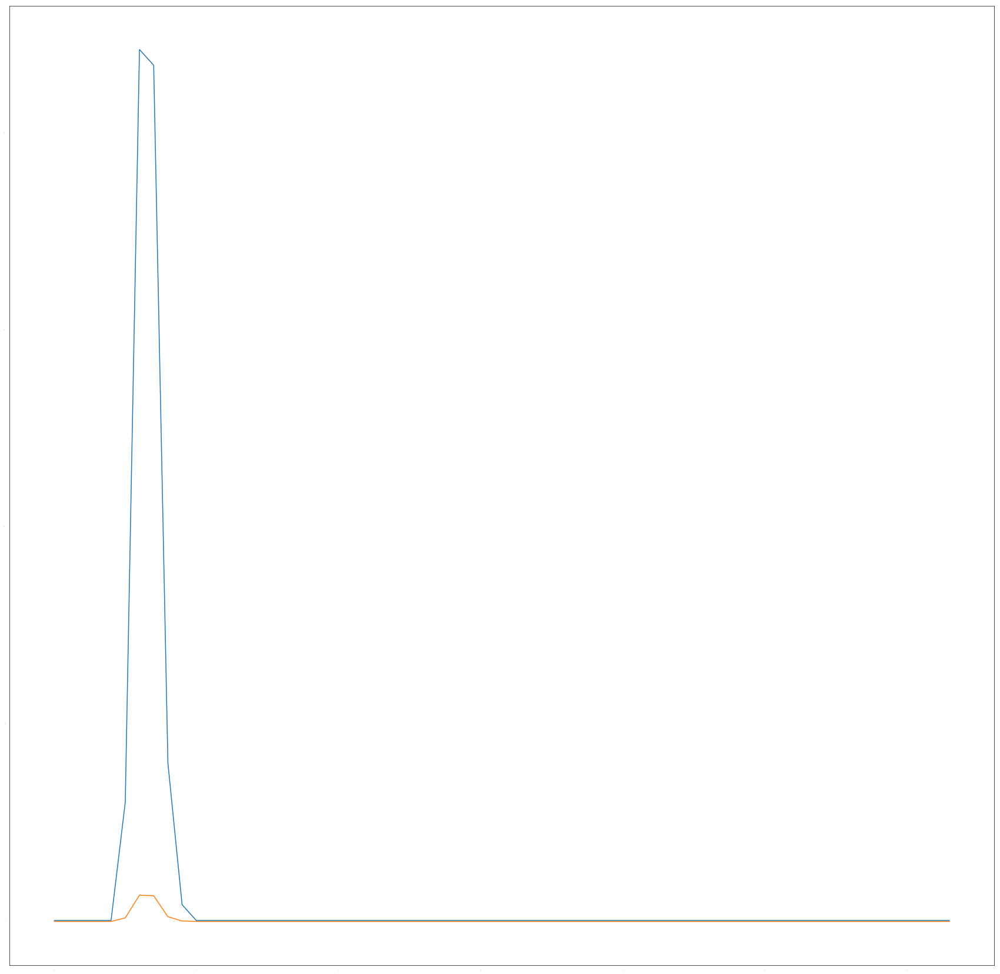

In [168]:
plt.plot(segments[10])
plt.plot(segments2[10])

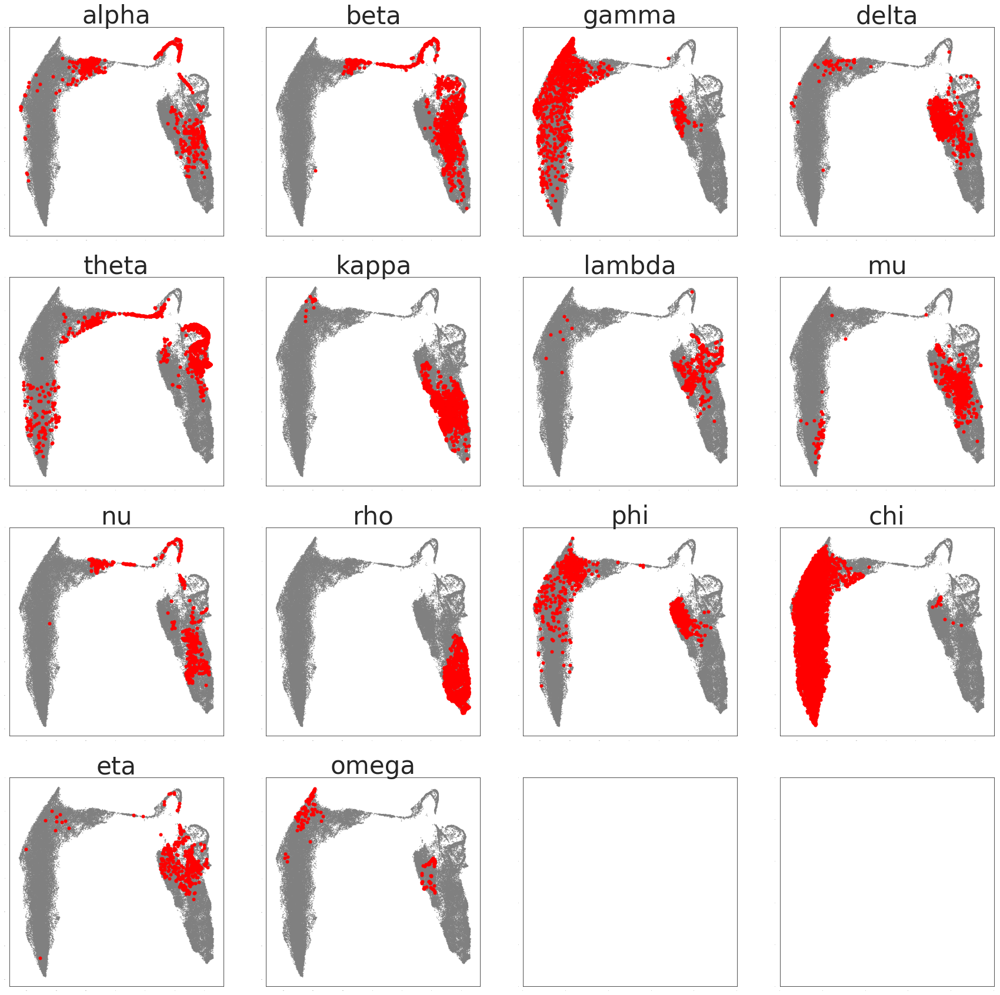

In [209]:
# load observation classifications from Huppenkothen 2017
%matplotlib inline

import matplotlib.pyplot as plt


clean_belloni = open('../../../data_GRS1915/1915Belloniclass_updated.dat')
lines = clean_belloni.readlines()
states = lines[0].split()
belloni_clean = {}
for h,l in zip(states, lines[1:]):
    belloni_clean[h] = l.split()
    #state: obsID1, obsID2...
ob_state = {}
for state, obs in belloni_clean.items():
    if state == "chi1" or state == "chi2" or state == "chi3" or state == "chi4": state = "chi"
    for ob in obs:
        ob_state[ob] = state
        
# load segmented light curves

import pickle
# with open('../../../data_GRS1915/95921_len512_s40_counts_errorfix.pkl', 'rb') as f:
#     segments = pickle.load(f)
# with open('../../../data_GRS1915/95921_len512_s40_errors_errorfix.pkl', 'rb') as f:
#     errors = pickle.load(f)
with open('../../../data_GRS1915/94465_len512_s40_ids_errorfix.pkl', 'rb') as f:
    seg_ids = pickle.load(f)

with open('../../../data_GRS1915/histograms_model_2020-04-20_14-24-04.pkl', 'rb') as f:
    segments = pickle.load(f)

# # HF QPO observation ids
# paper_obIDs = np.loadtxt("../../../data_GRS1915/Belloni_Altamirano_obsIDs.txt", dtype=str)

# qpo_colours = []

# for seg_id in seg_ids:
#     if seg_id.split("_")[0] in paper_obIDs:
#         qpo_colours.append("red")
#     else:
#         qpo_colours.append("grey")
        
# qpo_labels = []

# for seg_id in seg_ids:
#     if seg_id.split("_")[0] in paper_obIDs:
#         qpo_labels.append("QPO")
#     else:
#         qpo_labels.append("other")
        
        
# qpo_scales = []

# for seg_id in seg_ids:
#     if seg_id.split("_")[0] in paper_obIDs:
#         qpo_scales.append("QPO")
#     else:
#         qpo_scales.append("other")
        
        
xxx = [seg.split("_")[0] for seg in seg_ids]

classes = np.array(["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"])
class_colour = []
for ob in xxx:
    if ob in ob_state:
        class_colour.append(np.where(classes == ob_state[ob])[0][0])
    else:
        class_colour.append(15)
        
classes = np.array(["alpha", "beta", "gamma", "delta", "theta", "kappa", "lambda", "mu", "nu", "rho", "phi", "chi", "eta", "omega"])
scales = []
class_name = []
for ob in xxx:
    if ob in ob_state:
        class_name.append(ob_state[ob])
        scales.append(5)
    else:
        class_name.append("Unknown")
        scales.append(0.1)
        
        
from matplotlib import cm
cm.get_cmap(plt.get_cmap("Set1"))


colours = ['#ffd8b1', '#000075', '#808080', '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#000000']

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
sns.set_style("white")
plt.rcParams['figure.figsize'] = (30.0, 30.0)
plt.rcParams.update({'font.size': 0})

embeddings_lap = means_umaped

# fig, ax = plt.subplots()

fig, axs = plt.subplots(4, 4)
axs = axs.flatten()

for plot_class_ind, plot_class in enumerate(classes):
    class_indices = np.where(np.array(class_name) == "Unknown")[0]
    class_data = embeddings_lap[class_indices]
    axs[plot_class_ind].scatter(class_data[:,0], class_data[:,1], s = 0.2, c="grey", label="Unknown")

    class_indices = np.where(np.array(class_name) == plot_class)[0]
    class_data = embeddings_lap[class_indices]
    
    axs[plot_class_ind].scatter(class_data[:,0], class_data[:,1], s = 25, c='red', label=plot_class)
    
# plt.legend()
    axs[plot_class_ind].set_title("{}".format(plot_class), fontsize=42)
axs.reshape((4,4))
# plt.savefig("classes_separate.png")

# plt.savefig("UMAP_embedding_separate_classes_model_2020-02-09_10-36-06.png")
plt.show()


# redint = np.where(np.array(qpo_colours) == "red")
# greyint= np.where(np.array(qpo_colours) != "red")
# plt.scatter(embeddings_lap[:,0][greyint], embeddings_lap[:,1][greyint], s=1, c="grey", label= "other")
# plt.scatter(embeddings_lap[:,0][redint], embeddings_lap[:,1][redint], s=1, c="red", label= "HF QPO")
# plt.title("UMAP embedding of the encoded GRS1915 segments, neighbors=50, min_dist=0.0, components=2", fontsize=12)
# plt.legend()
plt.show()

In [214]:
with open('../../../data_GRS1915/94465_len512_s40_counts_errorfix.pkl', 'rb') as f:
    segments = pickle.load(f)

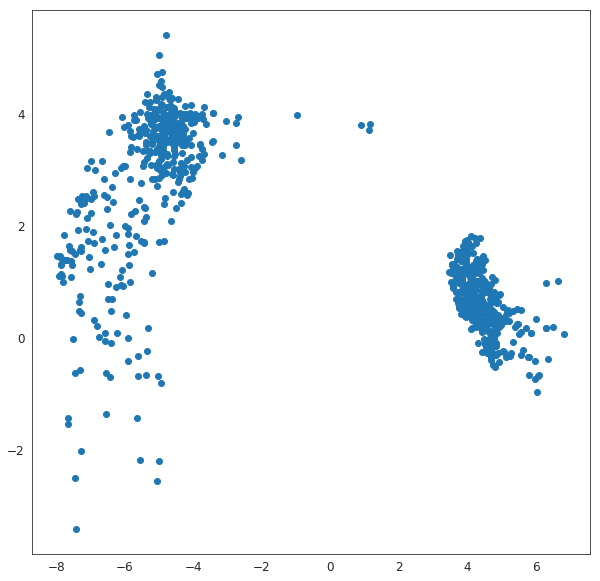

In [227]:
umapembed=means_umaped

plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.rcParams.update({'font.size': 12})
class_indices = np.where(np.array(class_name) == "phi")
class_data = umapembed[class_indices]
x_segs = segments[class_indices]
right_phi = x_segs[class_data[:,0]>3]
left_phi = x_segs[class_data[:,0]<-4]
plt.scatter(class_data[:,0], class_data[:,1])
plt.show()

In [ ]:
x_segs_rec = reconstructions[class_indices]
right_phi_rec = x_segs_rec[class_data[:,0]>3]
left_phi_rec = x_segs_rec[class_data[:,0]<-4]

In [ ]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)

fig, axs = plt.subplots(5, 2)
left_phi=np.squeeze(left_phi)
for rho_ind, plot_rho in enumerate(left_phi[15:20]):
    axs[rho_ind,0].plot(zscore(plot_rho))
    axs[rho_ind,0].plot(left_phi_rec[rho_ind])
    axs[rho_ind,0].set_ylim([-4,4])
right_phi=np.squeeze(right_phi)
for rho_ind, plot_rho in enumerate(right_phi[15:20]):
    axs[rho_ind,1].plot(zscore(plot_rho))
    axs[rho_ind,1].plot(right_phi_rec[rho_ind])
    axs[rho_ind,1].set_ylim([-4,4])
    
fig.text(0.5, 0.04, 'Time (s)', ha='center')
fig.text(0.04, 0.5, 'Count rate (counts/s)', va='center', rotation='vertical')
fig.text(0.25, 0.94, "Left cluster", ha='center', va="top")
fig.text(0.75, 0.94, "Right cluster", ha='center', va="top")
plt.savefig("gamma_segments_4.png")
plt.show()

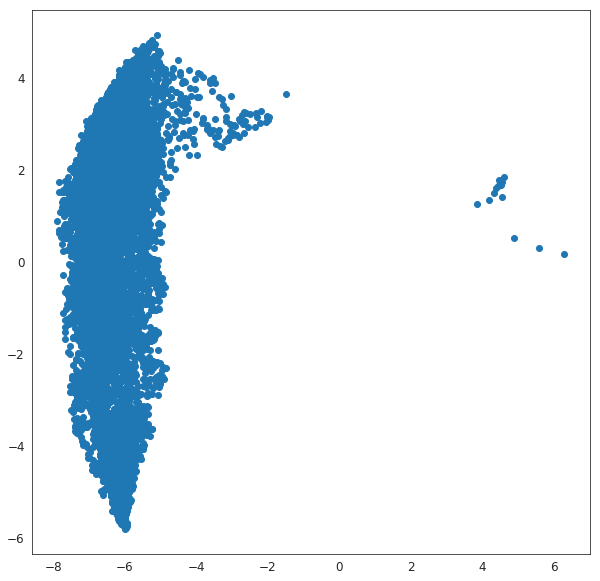

In [234]:
umapembed=means_umaped

plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.rcParams.update({'font.size': 12})
class_indices = np.where(np.array(class_name) == "chi")
class_data = umapembed[class_indices]
x_segs = segments[class_indices]
right_phi = x_segs[class_data[:,1]>4]
left_phi = x_segs[class_data[:,1]<-5]
plt.scatter(class_data[:,0], class_data[:,1])
plt.show()

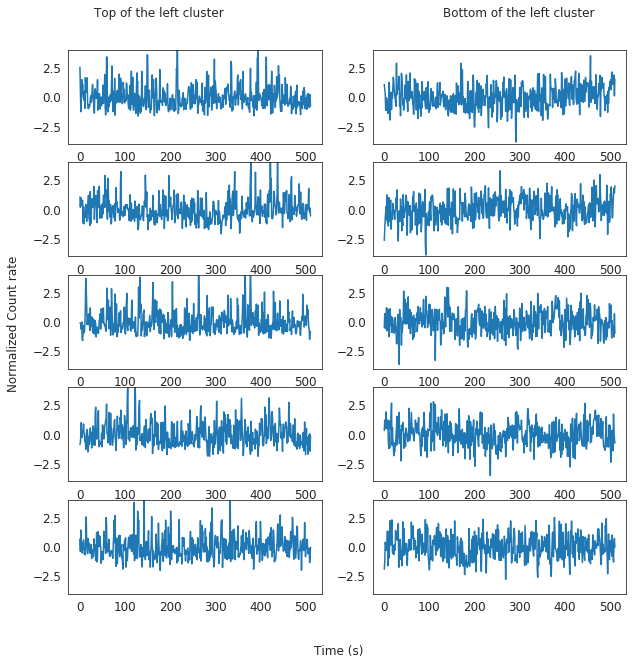

In [238]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)

fig, axs = plt.subplots(5, 2)
left_phi=np.squeeze(left_phi)
for rho_ind, plot_rho in enumerate(left_phi[15:20]):
    axs[rho_ind,0].plot(zscore(plot_rho))
    axs[rho_ind,0].set_ylim([-4,4])
right_phi=np.squeeze(right_phi)
for rho_ind, plot_rho in enumerate(right_phi[15:20]):
    axs[rho_ind,1].plot(zscore(plot_rho))
    axs[rho_ind,1].set_ylim([-4,4])
    
fig.text(0.5, 0.04, 'Time (s)', ha='center')
fig.text(0.04, 0.5, 'Normalized Count rate', va='center', rotation='vertical')
fig.text(0.25, 0.94, "Top of the left cluster", ha='center', va="top")
fig.text(0.75, 0.94, "Bottom of the left cluster", ha='center', va="top")
plt.savefig("gamma_segments_4.png")
plt.show()

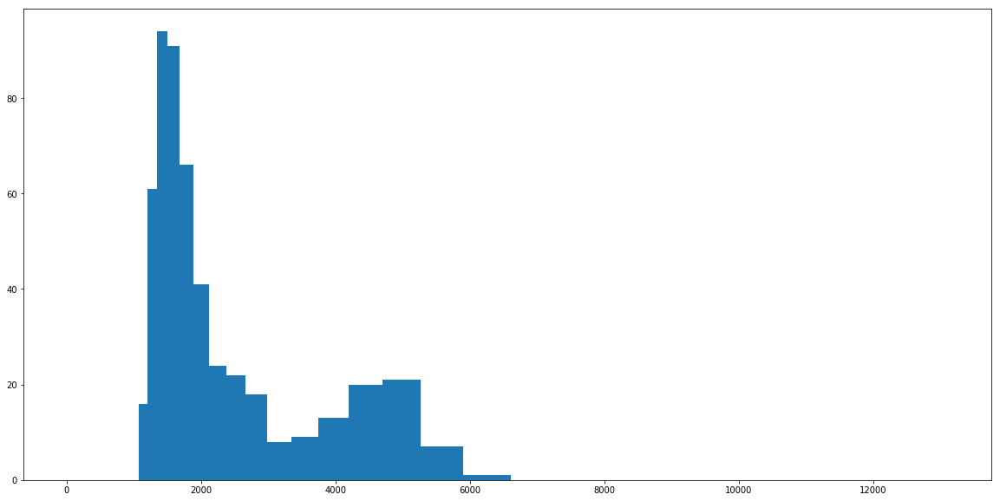

In [219]:
n+=1
plt.hist(segments[n].squeeze(), bins=np.logspace(np.log10(10),np.log10(13100), 64), density=False)
# plt.hist(segments[n].squeeze(), bins=64, density=False, range=[0,13100])

plt.show()


In [159]:
with open('../../../data_GRS1915/histograms_model_2020-04-20_14-24-04.pkl', 'rb') as f:
    hists = pickle.load(f)

In [162]:
list((range(0, 13100, 64)))

[0,
 64,
 128,
 192,
 256,
 320,
 384,
 448,
 512,
 576,
 640,
 704,
 768,
 832,
 896,
 960,
 1024,
 1088,
 1152,
 1216,
 1280,
 1344,
 1408,
 1472,
 1536,
 1600,
 1664,
 1728,
 1792,
 1856,
 1920,
 1984,
 2048,
 2112,
 2176,
 2240,
 2304,
 2368,
 2432,
 2496,
 2560,
 2624,
 2688,
 2752,
 2816,
 2880,
 2944,
 3008,
 3072,
 3136,
 3200,
 3264,
 3328,
 3392,
 3456,
 3520,
 3584,
 3648,
 3712,
 3776,
 3840,
 3904,
 3968,
 4032,
 4096,
 4160,
 4224,
 4288,
 4352,
 4416,
 4480,
 4544,
 4608,
 4672,
 4736,
 4800,
 4864,
 4928,
 4992,
 5056,
 5120,
 5184,
 5248,
 5312,
 5376,
 5440,
 5504,
 5568,
 5632,
 5696,
 5760,
 5824,
 5888,
 5952,
 6016,
 6080,
 6144,
 6208,
 6272,
 6336,
 6400,
 6464,
 6528,
 6592,
 6656,
 6720,
 6784,
 6848,
 6912,
 6976,
 7040,
 7104,
 7168,
 7232,
 7296,
 7360,
 7424,
 7488,
 7552,
 7616,
 7680,
 7744,
 7808,
 7872,
 7936,
 8000,
 8064,
 8128,
 8192,
 8256,
 8320,
 8384,
 8448,
 8512,
 8576,
 8640,
 8704,
 8768,
 8832,
 8896,
 8960,
 9024,
 9088,
 9152,
 9216,
 928

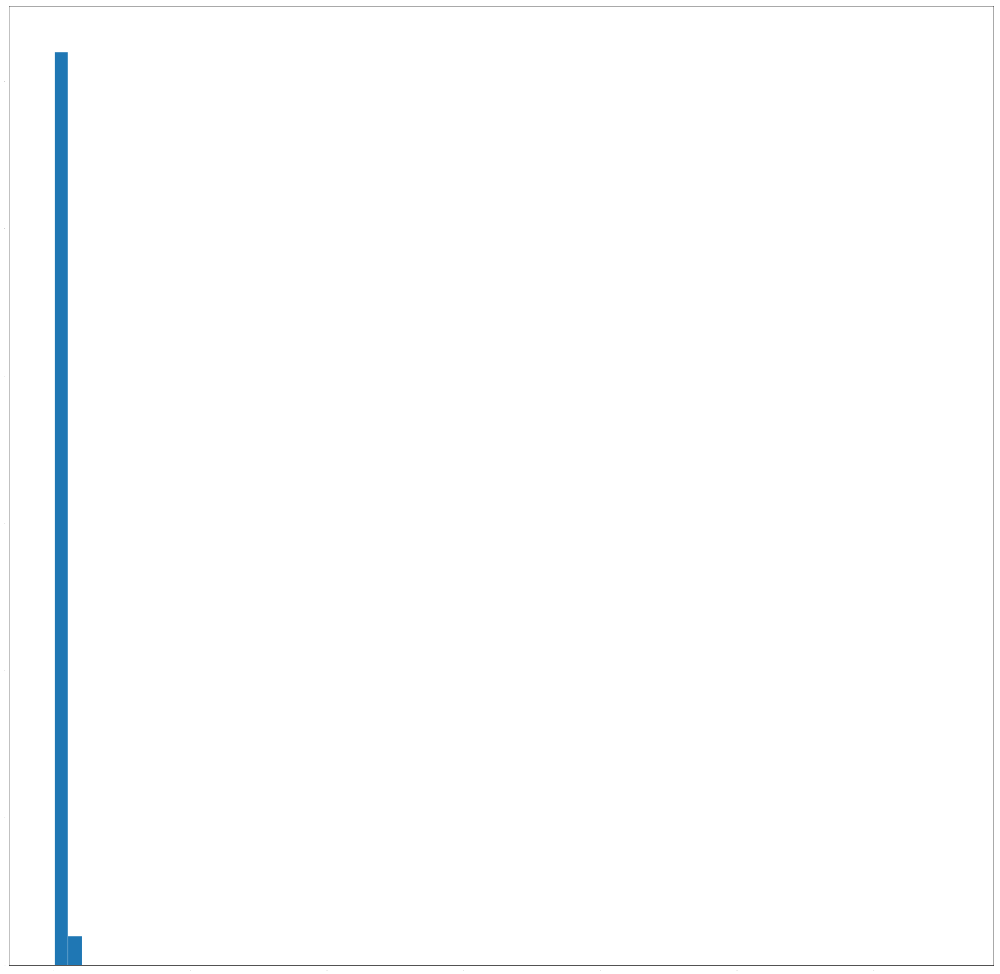

In [166]:
plt.plot(hists[0], range=[0, 13100], bins=64)
plt.show()

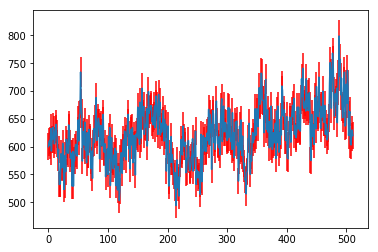

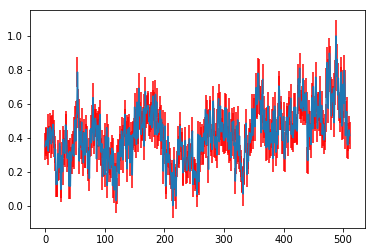

In [11]:
plt.errorbar(y=segments[0],x=list(range(512)), yerr=errors[0], ecolor="red")
plt.show()
plt.errorbar(y=segments2[0],x=list(range(512)), yerr=errors2[0], ecolor="red")
plt.show()